#### Install additional libraries #####

In [1]:
%%capture
!pip install awswrangler
!pip install missingno
!pip install  U- plotly
!pip install  U- seaborn
# %%capture
# !pip install lux-api
# conda install -c conda-forge lux-api
#!pip install pandas-profiling[notebook]

#### Import Libraries ####

In [3]:
import numpy as np
import pandas as pd
from pandas.api.types import is_string_dtype, is_numeric_dtype
from datetime import datetime, date, timedelta
import os
import math
import warnings 
import pyodbc
import time
import pickle
import boto3
from io import BytesIO
import re
import awswrangler as wr
%matplotlib inline
import matplotlib.pyplot as plt
import missingno
import warnings
import seaborn as sns
# import lux
#from pandas_profiling import ProfileReport
warnings.filterwarnings("ignore")
warnings.simplefilter('ignore')

Matplotlib is building the font cache; this may take a moment.


In [4]:
warnings.filterwarnings("ignore")

In [5]:
import multiprocessing
import os

print(multiprocessing.cpu_count())
# print(os.cpu_count())

64


In [4]:
#######https://medium.com/spatial-data-science/4-tools-to-speed-up-exploratory-data-analysis-eda-in-python-e240ebcd18de

#########https://github.com/lux-org/lux/issues/141

############https://lux-api.readthedocs.io/en/latest/source/getting_started/installation.html

###############https://lux-api.readthedocs.io/en/latest/source/getting_started/overview.html

#### Read mortgage dataset

In [6]:
import time
start_time = time.time()
from io import BytesIO


df = wr.s3.read_csv("s3://daan888/projectcr/data/raw/mortgage_risk_unique.csv", skip_blank_lines=True)

df.reset_index(drop=True, inplace=True)

### clean columns names

df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')

print("--- %s seconds ---" % (time.time() - start_time))  

--- 0.9197597503662109 seconds ---


In [7]:
df.columns

Index(['id', 'time', 'orig_time', 'first_time', 'mat_time', 'balance_time',
       'ltv_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time',
       'retype_co_orig_time', 'retype_pu_orig_time', 'retype_sf_orig_time',
       'investor_orig_time', 'balance_orig_time', 'fico_orig_time',
       'ltv_orig_time', 'interest_rate_orig_time', 'hpi_orig_time',
       'default_time', 'payoff_time', 'status_time', 'max_periods'],
      dtype='object')

In [8]:
# Data Set Mortgage
# The data set mortgage is in panel form and reports origination and performance observations for 50,000 residential U.S. mortgage borrowers over 60 periods. The periods have been deidentified. As in the real world, loans may originate before the start of the observation period (this is an issue where loans are transferred between banks and investors as in securitization). The loan observations may thus be censored as the loans mature or borrowers refinance. The data set is a randomized selection of mortgage-loan-level data collected from the portfolios underlying U.S. residential mortgage-backed securities (RMBS) securitization portfolios and provided by International Financial Research (www.internationalfinancialresearch.org). Go to www.win-rar.com if ﻿you require a program to decompress. Key variables include:
# ◾ id: Borrower ID
# ◾ time: Time stamp of observation
# ◾ orig_time: Time stamp for origination
# ◾ first_time: Time stamp for first observation
# ◾ mat_time: Time stamp for maturity
# ◾ balance_time: Outstanding balance at observation time
# ◾ LTV_time: Loan-to-value ratio at observation time, in %
# ◾ interest_rate_time: Interest rate at observation time, in %
# ◾ hpi_time: House price index at observation time, base year = 100
# ◾ gdp_time: Gross domestic product (GDP) growth at observation time, in %
# ◾ uer_time: Unemployment rate at observation time, in %
# ◾ REtype_CO_orig_time: Real estate type condominium = 1, otherwise = 0
# ◾ REtype_PU_orig_time: Real estate type planned urban development = 1, otherwise = 0
# ◾ REtype_SF_orig_time: Single-family home = 1, otherwise = 0
# ◾ investor_orig_time: Investor borrower = 1, otherwise = 0
# ◾ balance_orig_time: Outstanding balance at origination time
# ◾ FICO_orig_time: FICO score at origination time, in %
# ◾ LTV_orig_time: Loan-to-value ratio at origination time, in %
# ◾ Interest_Rate_orig_time: Interest rate at origination time, in %
# ◾ hpi_orig_time: House price index at origination time, base year = 100
# ◾ default_time: Default observation at observation time
# ◾ payoff_time: Payoff observation at observation time
# ◾ status_time: Default (1), payoff (2), and nondefault/nonpayoff (0) observation at observation time

##### Basic data exploration

In [9]:
df.shape

(50000, 24)

In [10]:
# Rows containing duplicate data
duplicate_rows_df = df[df.duplicated()]
print("number of duplicate rows: ", duplicate_rows_df.shape)

number of duplicate rows:  (0, 24)


In [11]:
df.dtypes

id                           int64
time                         int64
orig_time                    int64
first_time                   int64
mat_time                     int64
balance_time               float64
ltv_time                   float64
interest_rate_time         float64
hpi_time                   float64
gdp_time                   float64
uer_time                   float64
retype_co_orig_time          int64
retype_pu_orig_time          int64
retype_sf_orig_time          int64
investor_orig_time           int64
balance_orig_time          float64
fico_orig_time               int64
ltv_orig_time              float64
interest_rate_orig_time    float64
hpi_orig_time              float64
default_time                 int64
payoff_time                  int64
status_time                  int64
max_periods                  int64
dtype: object

In [12]:
#### drop max periods #######

In [13]:
df.drop(['max_periods','payoff_time', 'status_time', 'max_periods'], axis=1, inplace=True)

In [14]:
df.columns

Index(['id', 'time', 'orig_time', 'first_time', 'mat_time', 'balance_time',
       'ltv_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time',
       'retype_co_orig_time', 'retype_pu_orig_time', 'retype_sf_orig_time',
       'investor_orig_time', 'balance_orig_time', 'fico_orig_time',
       'ltv_orig_time', 'interest_rate_orig_time', 'hpi_orig_time',
       'default_time'],
      dtype='object')

In [15]:
###### convert id to object ########

In [16]:
df['id'] = df['id'].astype(str) 

In [17]:

# df['default_time'] = df['default_time'].astype('category')

In [18]:
######### Convert some int var to object based on description ########

In [19]:
print(df.default_time.unique())


print('------------')


[1 0]
------------


In [20]:
print(df.retype_co_orig_time.unique())


print('------------')
print('------------')


print(df.retype_pu_orig_time.unique())

[0 1]
------------
------------
[0 1]


In [21]:
print(df.retype_sf_orig_time.unique())


print('------------')
print('------------')


print(df.investor_orig_time.unique())

[1 0]
------------
------------
[0 1]


In [22]:
import time
start_time = time.time()

df['retype_co_orig_time'] = df['retype_co_orig_time'].astype(object)

df['retype_pu_orig_time'] = df['retype_pu_orig_time'].astype(object)

df['retype_sf_orig_time'] = df['retype_sf_orig_time'].astype(object)

df['investor_orig_time'] = df['investor_orig_time'].astype(object)

print("--- %s seconds ---" % (time.time() - start_time))  

--- 0.006354808807373047 seconds ---


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       50000 non-null  object 
 1   time                     50000 non-null  int64  
 2   orig_time                50000 non-null  int64  
 3   first_time               50000 non-null  int64  
 4   mat_time                 50000 non-null  int64  
 5   balance_time             50000 non-null  float64
 6   ltv_time                 49982 non-null  float64
 7   interest_rate_time       50000 non-null  float64
 8   hpi_time                 50000 non-null  float64
 9   gdp_time                 50000 non-null  float64
 10  uer_time                 50000 non-null  float64
 11  retype_co_orig_time      50000 non-null  object 
 12  retype_pu_orig_time      50000 non-null  object 
 13  retype_sf_orig_time      50000 non-null  object 
 14  investor_orig_time    

In [24]:
df.describe()

,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,uer_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time
count,50000.000000,50000.000000,50000.000000,50000.000000,5.000000e+04,49982.000000,50000.000000,50000.000000,50000.000000,50000.000000,5.000000e+04,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,36.170740,20.388240,24.696100,137.923620,2.389723e+05,79.312091,7.014623,190.291879,1.690324,6.000876,2.519769e+05,661.297200,79.707362,5.442125,196.366771,0.303080
std,13.992896,7.881274,7.898468,17.944199,2.030908e+05,25.132774,2.214244,26.286099,1.917736,1.674600,2.088676e+05,72.795473,9.920389,3.288040,34.352690,0.459594
min,1.000000,-40.000000,1.000000,18.000000,0.000000e+00,0.000000,0.000000,107.830000,-4.146711,3.800000,0.000000e+00,400.000000,50.100000,0.000000,75.710000,0.000000
25%,26.000000,17.000000,20.000000,136.000000,1.058409e+05,64.116470,5.875000,162.090000,1.229172,4.700000,1.140000e+05,611.000000,75.000000,3.000000,179.450000,0.000000
50%,32.000000,22.000000,25.000000,141.000000,1.835795e+05,78.718905,7.000000,189.820000,2.274218,5.500000,1.920000e+05,663.000000,80.000000,6.375000,212.730000,0.000000
75%,46.000000,25.000000,28.000000,145.000000,3.195667e+05,95.745375,8.350000,217.370000,2.836358,6.500000,3.350000e+05,715.000000,85.000000,7.625000,222.390000,1.000000
max,60.000000,60.000000,60.000000,229.000000,8.688101e+06,616.985143,37.500000,226.290000,5.132464,10.000000,8.000000e+06,840.000000,218.500000,19.750000,226.290000,1.000000


In [25]:
######## missing values exp########

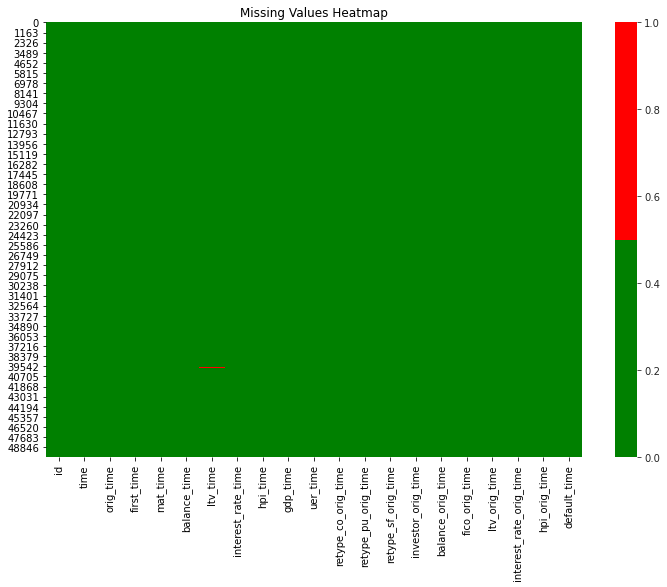

In [26]:
cols = df.columns 
colours = ['g', 'r'] 
f, ax = plt.subplots(figsize = (12,8))
sns.set_style("whitegrid")
plt.title('Missing Values Heatmap', )
sns.heatmap(df[cols].isnull(), cmap=sns.color_palette(colours));

In [27]:
df.isna().sum()

id                          0
time                        0
orig_time                   0
first_time                  0
mat_time                    0
balance_time                0
ltv_time                   18
interest_rate_time          0
hpi_time                    0
gdp_time                    0
uer_time                    0
retype_co_orig_time         0
retype_pu_orig_time         0
retype_sf_orig_time         0
investor_orig_time          0
balance_orig_time           0
fico_orig_time              0
ltv_orig_time               0
interest_rate_orig_time     0
hpi_orig_time               0
default_time                0
dtype: int64

In [28]:
missing_count = df.isnull().sum() # the count of missing values
value_count = df.isnull().count() # the count of all values 
missing_percentage = round(missing_count / value_count * 100,2) #the percentage of missing values
missing_df = pd.DataFrame({'count': missing_count, 'percentage': missing_percentage}) #create a dataframe
print(missing_df)

                         count  percentage
id                           0        0.00
time                         0        0.00
orig_time                    0        0.00
first_time                   0        0.00
mat_time                     0        0.00
balance_time                 0        0.00
ltv_time                    18        0.04
interest_rate_time           0        0.00
hpi_time                     0        0.00
gdp_time                     0        0.00
uer_time                     0        0.00
retype_co_orig_time          0        0.00
retype_pu_orig_time          0        0.00
retype_sf_orig_time          0        0.00
investor_orig_time           0        0.00
balance_orig_time            0        0.00
fico_orig_time               0        0.00
ltv_orig_time                0        0.00
interest_rate_orig_time      0        0.00
hpi_orig_time                0        0.00
default_time                 0        0.00


In [29]:
import pandas as pd
from pandas import option_context

with option_context("display.max_rows", None,"display.max_colwidth",60,"display.max_columns",50):
        display(df.head(2))

,id,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,uer_time,retype_co_orig_time,retype_pu_orig_time,retype_sf_orig_time,investor_orig_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time
0,1,48,-7,25,113,29087.21,26.658065,9.20,146.45,2.715903,8.3,0,0,1,0,45000.0,715,69.4,9.20,87.03,1
1,2,26,18,25,138,105654.77,65.469851,7.68,225.10,2.151365,4.7,0,0,1,0,107200.0,558,80.0,7.68,186.91,0


In [30]:
import pandas as pd
from pandas import option_context

with option_context("display.max_rows", None,"display.max_colwidth",60,"display.max_columns",50):
        display(df.head(2).transpose())

,0,1
id,1,2
time,48,26
orig_time,-7,18
first_time,25,25
mat_time,113,138
balance_time,29087.2,105655
ltv_time,26.6581,65.4699
interest_rate_time,9.2,7.68
hpi_time,146.45,225.1
gdp_time,2.7159,2.15136


In [31]:
import pandas as pd
from pandas import option_context

with option_context("display.max_rows", None,"display.max_colwidth",60,"display.max_columns",50):
        display(df.head(2))

,id,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,uer_time,retype_co_orig_time,retype_pu_orig_time,retype_sf_orig_time,investor_orig_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time
0,1,48,-7,25,113,29087.21,26.658065,9.20,146.45,2.715903,8.3,0,0,1,0,45000.0,715,69.4,9.20,87.03,1
1,2,26,18,25,138,105654.77,65.469851,7.68,225.10,2.151365,4.7,0,0,1,0,107200.0,558,80.0,7.68,186.91,0


In [ ]:
######### Proportion of our target variable #################

In [65]:
df['default_time'].value_counts()

0    34846
1    15154
Name: default_time, dtype: int64

In [62]:
df['default_time'].value_counts(normalize=True)

0    0.69692
1    0.30308
Name: default_time, dtype: float64

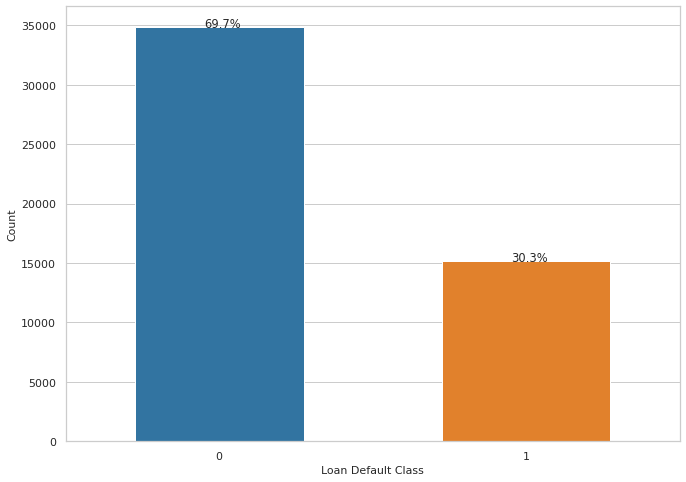

In [63]:
sns.set(style="whitegrid")
plt.figure(figsize=(11,8))

color_labels = df['default_time'].unique()

# List of color palette to use
rgb_values = sns.color_palette("tab10", 2)

# Map label to color palette

color_map = dict(zip(color_labels, rgb_values))


ax = sns.countplot(x="default_time", data=df,palette=df['default_time'].map(color_map))

plt.xticks(size=11)
plt.xlabel('Loan Default Class', size=  11)
plt.yticks(size=11)
plt.ylabel('Count', size=  11)

def without_hue(plot, feature):
    total = len(feature)
    for p in plot.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 11.5)
    plt.show()
    
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .55)

without_hue(ax, df.default_time)
plt.show()

In [32]:
############ Numerical generic EDA first ###########

In [33]:
# populate the list of numeric attributes and categorical attributes
num_list = []
cat_list = []

for column in df.iloc[:, 1:]:
    if is_numeric_dtype(df[column]):
        num_list.append(column)
    elif is_string_dtype(df[column]):
        cat_list.append(column)    

print(num_list)

print('------------')

print(cat_list)

['time', 'orig_time', 'first_time', 'mat_time', 'balance_time', 'ltv_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time', 'balance_orig_time', 'fico_orig_time', 'ltv_orig_time', 'interest_rate_orig_time', 'hpi_orig_time', 'default_time']
------------
['retype_co_orig_time', 'retype_pu_orig_time', 'retype_sf_orig_time', 'investor_orig_time']


In [34]:
cat_list[0:4]

['retype_co_orig_time',
 'retype_pu_orig_time',
 'retype_sf_orig_time',
 'investor_orig_time']

In [35]:
# cat_list = cat_list = []

In [36]:
# for column in df.iloc[:, 1:]:
#     print(column)

In [37]:
# for column in df.iloc[:, 1:-1]:
#     print(column)

In [38]:
for column in df.iloc[:, 2:-3]:
    print(column)

orig_time
first_time
mat_time
balance_time
ltv_time
interest_rate_time
hpi_time
gdp_time
uer_time
retype_co_orig_time
retype_pu_orig_time
retype_sf_orig_time
investor_orig_time
balance_orig_time
fico_orig_time
ltv_orig_time


In [38]:
features = df.iloc[:, 2:-3].columns.tolist()

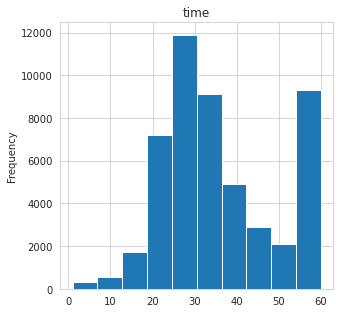

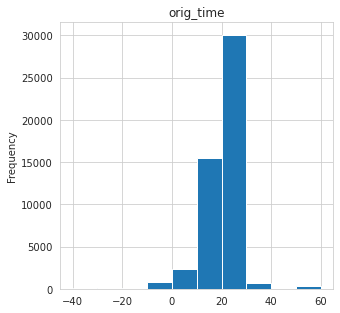

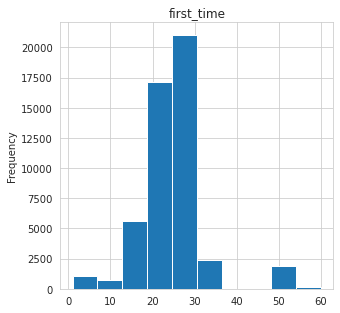

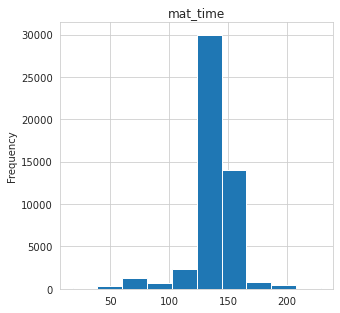

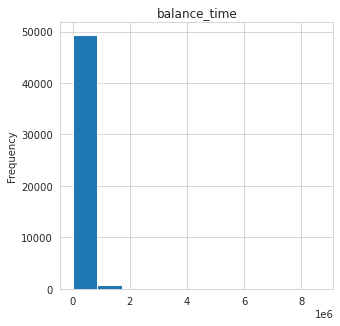

...

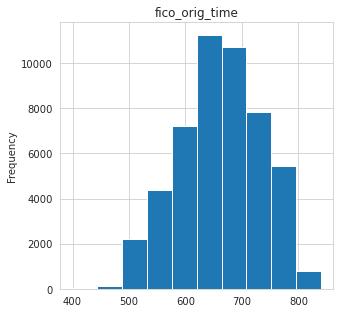

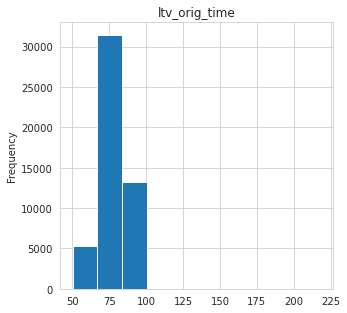

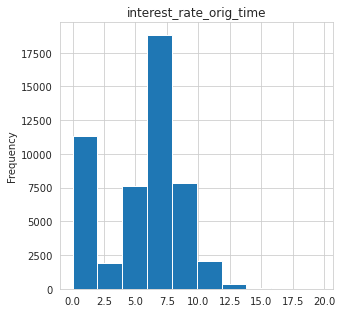

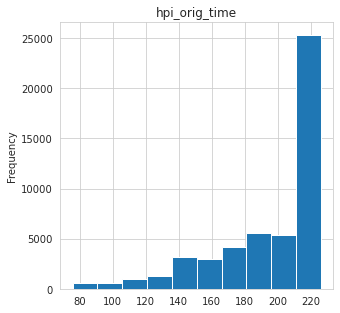

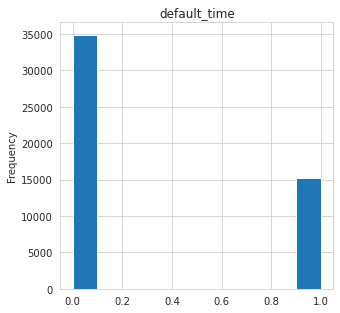

In [39]:
### 3. Univaraite Analysis ###

# bar chart and histogram
for column in df.iloc[:, 1:]:
    #print(column)
    plt.figure(column, figsize = (4.9,4.9))
    plt.title(column)
    if is_numeric_dtype(df[column]) :
        df[column].plot(kind = 'hist')
    elif is_string_dtype(df[column]):
 # show only the TOP 10 value count in each categorical data
        df[column].value_counts()[:10].plot(kind = 'bar')

In [40]:
def histograms_numeric_columns(df, numerical_columns):
    import seaborn as sns
    '''
    Takes df, numerical columns as list
    Returns a group of histagrams
    '''
    f = pd.melt(df, value_vars=numerical_columns) 
    g = sns.FacetGrid(f, col='variable',  col_wrap=4, sharex=False, sharey=False)
    g = g.map(sns.distplot, 'value')
    return g

In [41]:
num_list

['time',
 'orig_time',
 'first_time',
 'mat_time',
 'balance_time',
 'ltv_time',
 'interest_rate_time',
 'hpi_time',
 'gdp_time',
 'uer_time',
 'balance_orig_time',
 'fico_orig_time',
 'ltv_orig_time',
 'interest_rate_orig_time',
 'hpi_orig_time',
 'default_time']

--- 8.650930404663086 seconds ---


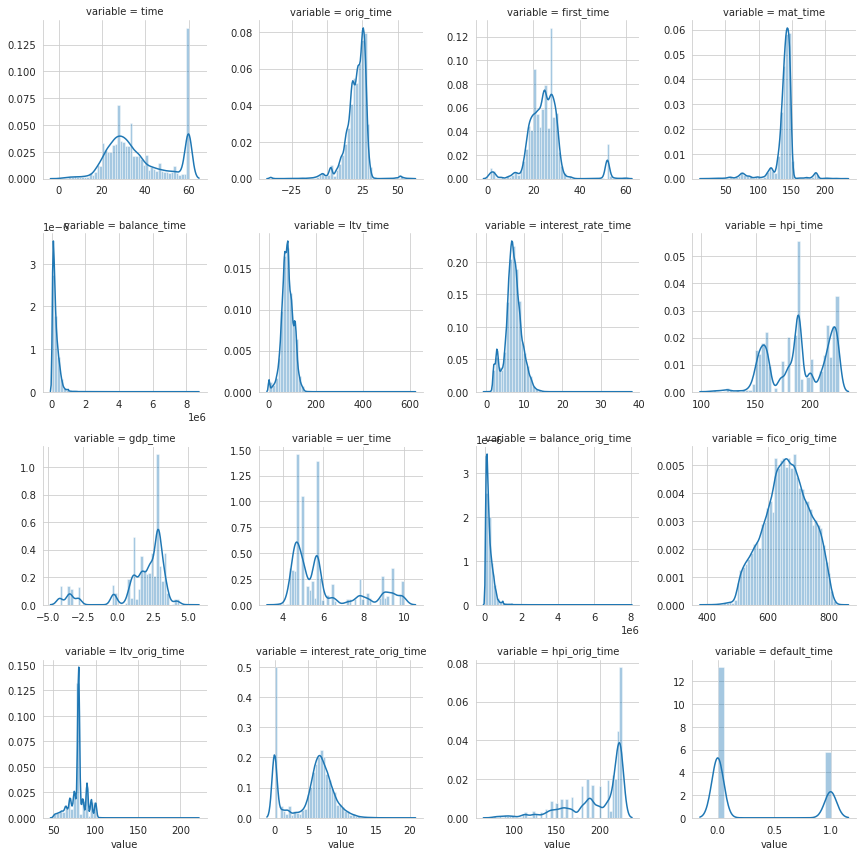

In [42]:
import time
start_time = time.time()

warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.simplefilter('ignore')

histograms_numeric_columns(df,num_list)

print("--- %s seconds ---" % (time.time() - start_time)) 

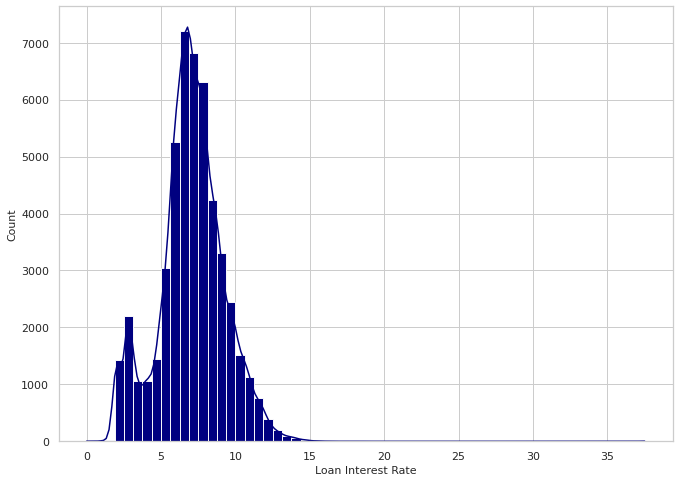

In [72]:
sns.set(style="whitegrid")
plt.figure(figsize=(11,8))

sns.histplot(data = df
            ,x = 'interest_rate_time'
            ,color = 'navy'
            ,alpha = 1
             ,bins = 60
             ,kde = True
            )

plt.xticks(size=11)
plt.xlabel('Loan Interest Rate', size=  11)
plt.yticks(size=11)
plt.ylabel('Count', size=  11)

plt.show()

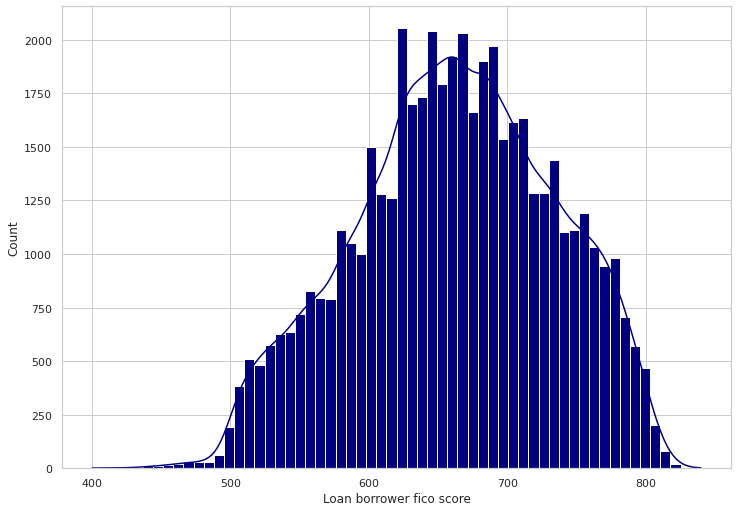

In [79]:
sns.set(style="whitegrid")
plt.figure(figsize=(12,8.5))

sns.histplot(data = df
            ,x = 'fico_orig_time'
            ,color = 'navy'
            ,alpha = 1
             ,bins = 60
             ,kde = True
#              ,kde = True
            )

plt.xticks(size=11)
plt.xlabel('Loan borrower fico score', size=12)        #fontdict= { 'fontsize': 12, 'fontweight':'bold'})
plt.yticks(size=11)
plt.ylabel('Count', size=  12)

plt.show()

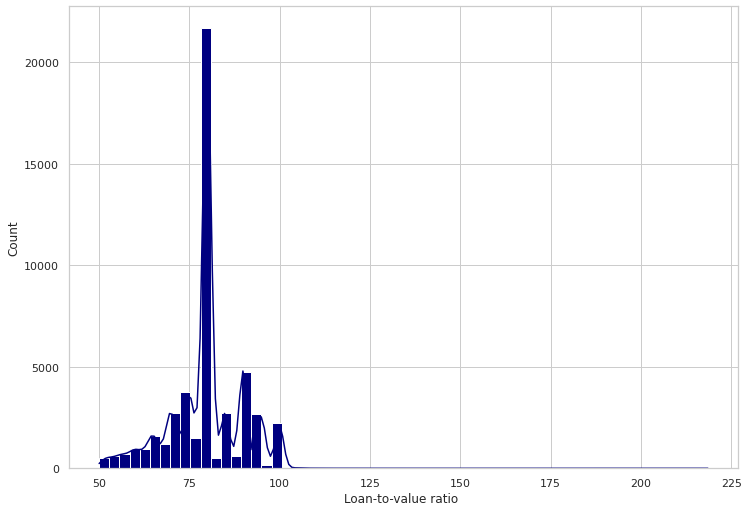

In [80]:
sns.set(style="whitegrid")
plt.figure(figsize=(12,8.5))

sns.histplot(data = df
            ,x = 'ltv_orig_time'
            ,color = 'navy'
            ,alpha = 1
             ,bins = 60
             ,kde = True
#              ,kde = True
            )

plt.xticks(size=11)
plt.xlabel('Loan-to-value ratio ', size=12)        #fontdict= { 'fontsize': 12, 'fontweight':'bold'})
plt.yticks(size=11)
plt.ylabel('Count', size=  12)

plt.show()

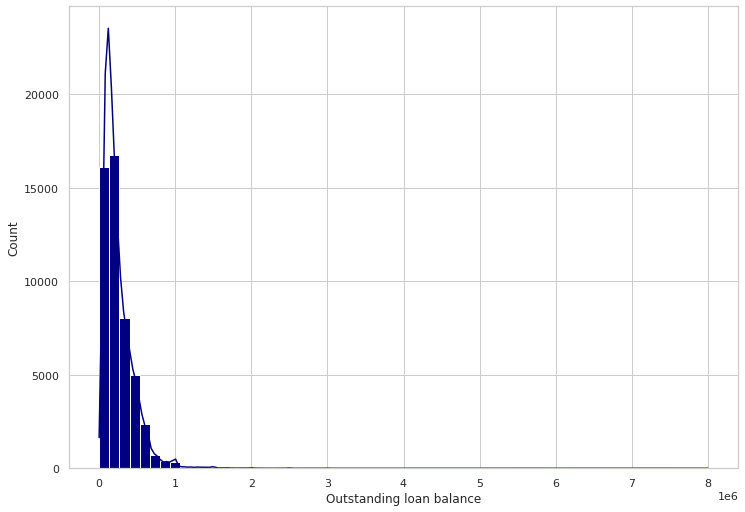

In [90]:
sns.set(style="whitegrid")
plt.figure(figsize=(12,8.5))

sns.histplot(data = df
            ,x = 'balance_orig_time'
            ,color = 'navy'
            ,alpha = 1
             ,bins = 60
             ,kde = True
#              ,kde = True
            )

plt.xticks(size=11)
plt.xlabel('Outstanding loan balance', size=12)        #fontdict= { 'fontsize': 12, 'fontweight':'bold'})
plt.yticks(size=11)
plt.ylabel('Count', size=  12)

plt.show()

In [81]:
import plotly.express as px
fig = px.histogram(df, x="fico_orig_time", color='default_time',
                   template="plotly_white",width=900, height=700)
fig.show()

In [53]:
df[df['default_time']==0].head(1)

,id,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,...,retype_co_orig_time,retype_pu_orig_time,retype_sf_orig_time,investor_orig_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time
1,2,26,18,25,138,105654.77,65.469851,7.68,225.1,2.151365,...,0,0,1,0,107200.0,558,80.0,7.68,186.91,0


In [64]:
df[df['default_time']==0]['fico_orig_time'].values

array([558, 680, 587, ..., 750, 779, 653])

In [83]:
# import plotly.graph_objects as go

# x0 = df[df['default_time']==0]['fico_orig_time'].values
# x1 = df[df['default_time']==0]['fico_orig_time'].values

# fig = go.Figure()

# fig.add_trace(go.Histogram(x=x0, name='non default'))


# fig.add_trace(go.Histogram(x=x1,name='default'))

# # The two histograms are drawn on top of another
# fig.update_layout(barmode='stack',
#                     showlegend=True,
#     width=900,
#     height=670,
#    title={
#         'text': "",
#         'y':0.9,
#         'x':0.5,
#         'xanchor': 'center',
#         'yanchor': 'top'},
#     template = 'plotly_white',  
#      yaxis_tickfont_size=14,
#      xaxis=dict(
#         type = 'category',
#         title='Fico score distribution by default status',
#         titlefont_size=16,
#         tickfont_size=14,
#         categoryorder='total ascending')
#              )
                     
# fig.show()

In [84]:
import plotly.express as px
fig = px.histogram(df, x="ltv_time", color='default_time',
                   template="plotly_white",width=900, height=700)
fig.show()

In [85]:
import plotly.express as px
fig = px.histogram(df, x="hpi_time", color='default_time',template="plotly_white")
fig.show()

In [88]:
# fig = px.histogram(df, x="balance_time", template="plotly_white")
# # The two histograms are drawn on top of another
# fig.update_layout(
#                     showlegend=True,
#     width=900,
#     height=670,
#    title={
#         'text': "",
#         'y':0.9,
#         'x':0.5,
#         'xanchor': 'center',
#         'yanchor': 'top'},
#     template = 'plotly_white',  
#      yaxis_tickfont_size=14,
#      xaxis=dict(
#         title='balance amount by default status',
#         titlefont_size=16,
#         tickfont_size=14
#          ,
#          dtick=200000,
#          range = [0,3000000]
#     )
#              )
                     
# fig.show()


In [87]:
fig = px.histogram(df, x="balance_time", color='default_time',template="plotly_white")
# The two histograms are drawn on top of another
fig.update_layout(
                    showlegend=True,
    width=900,
    height=670,
   title={
        'text': "",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    template = 'plotly_white',  
     yaxis_tickfont_size=14,
     xaxis=dict(
        title='balance amount by default status',
        titlefont_size=16,
        tickfont_size=14
         ,
         dtick=1000000,
         range = [0,5000000]
    )
             )
                     
fig.show()


In [80]:
import pandas as pd
from pandas import option_context

with option_context("display.max_rows", None,"display.max_colwidth",60,"display.max_columns",50):
        display(df.describe().transpose())

,count,mean,std,min,25%,50%,75%,max
time,50000.0,36.170740,13.992896,1.000000,26.000000,32.000000,46.000000,6.000000e+01
orig_time,50000.0,20.388240,7.881274,-40.000000,17.000000,22.000000,25.000000,6.000000e+01
first_time,50000.0,24.696100,7.898468,1.000000,20.000000,25.000000,28.000000,6.000000e+01
mat_time,50000.0,137.923620,17.944199,18.000000,136.000000,141.000000,145.000000,2.290000e+02
balance_time,50000.0,238972.292454,203090.780403,0.000000,105840.930000,183579.535000,319566.747500,8.688101e+06
ltv_time,49982.0,79.312091,25.132774,0.000000,64.116470,78.718905,95.745375,6.169851e+02
interest_rate_time,50000.0,7.014623,2.214244,0.000000,5.875000,7.000000,8.350000,3.750000e+01
hpi_time,50000.0,190.291879,26.286099,107.830000,162.090000,189.820000,217.370000,2.262900e+02
gdp_time,50000.0,1.690324,1.917736,-4.146711,1.229172,2.274218,2.836358,5.132464e+00
uer_time,50000.0,6.000876,1.674600,3.800000,4.700000,5.500000,6.500000,1.000000e+01


In [45]:
df.columns

Index(['id', 'time', 'orig_time', 'first_time', 'mat_time', 'balance_time',
       'ltv_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time',
       'retype_co_orig_time', 'retype_pu_orig_time', 'retype_sf_orig_time',
       'investor_orig_time', 'balance_orig_time', 'fico_orig_time',
       'ltv_orig_time', 'interest_rate_orig_time', 'hpi_orig_time',
       'default_time'],
      dtype='object')

In [212]:
##### heatmap  #######

In [213]:
corr = df.drop(['id','default_time'], axis=1).corr() 

corr

,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,uer_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time
time,1.000000,0.363299,0.554557,0.169525,0.027130,0.138898,-0.443088,-0.312469,-0.015633,0.370843,0.083396,0.166026,-0.064847,0.046087,0.340774
orig_time,0.363299,1.000000,0.608730,0.579453,0.234332,0.558477,-0.218574,-0.086485,-0.216456,0.182416,0.223130,0.149000,-0.033212,-0.031018,0.849409
first_time,0.554557,0.608730,1.000000,0.324757,0.105352,0.292622,-0.206191,-0.076223,-0.145833,0.180993,0.115384,0.028623,0.000896,0.029674,0.524601
mat_time,0.169525,0.579453,0.324757,1.000000,0.231266,0.503191,-0.191612,-0.037124,-0.133696,0.082453,0.189747,0.060352,0.055831,-0.146513,0.562359
balance_time,0.027130,0.234332,0.105352,0.231266,1.000000,0.171674,-0.262418,-0.050573,-0.081896,0.092511,0.971898,0.298187,-0.172952,-0.106495,0.199559
ltv_time,0.138898,0.558477,0.292622,0.503191,0.171674,1.000000,-0.008488,-0.425269,-0.447484,0.423311,0.080782,0.055911,0.360341,0.043524,0.639503
interest_rate_time,-0.443088,-0.218574,-0.206191,-0.191612,-0.262418,-0.008488,1.000000,0.051932,-0.115459,-0.169799,-0.298394,-0.427685,0.172050,0.259060,-0.200979
hpi_time,-0.312469,-0.086485,-0.076223,-0.037124,-0.050573,-0.425269,0.051932,1.000000,0.492529,-0.784494,-0.068086,-0.081696,0.060145,-0.140727,-0.059496
gdp_time,-0.015633,-0.216456,-0.145833,-0.133696,-0.081896,-0.447484,-0.115459,0.492529,1.000000,-0.451414,-0.068731,-0.062750,-0.000124,-0.101191,-0.269905
uer_time,0.370843,0.182416,0.180993,0.082453,0.092511,0.423311,-0.169799,-0.784494,-0.451414,1.000000,0.110705,0.148799,-0.057645,0.076259,0.176449


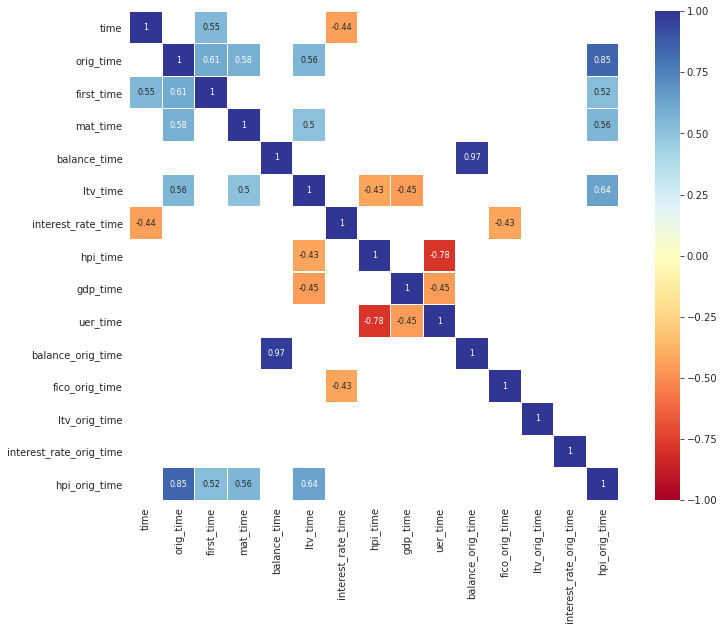

In [214]:
corr = df.drop(['id','default_time'], axis=1).corr() # correlations
plt.figure(figsize=(13, 9))

sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.4)], 
            cmap='RdYlBu', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

In [215]:
######## Looks like  Unemployment rate vs House price index are positively correlated

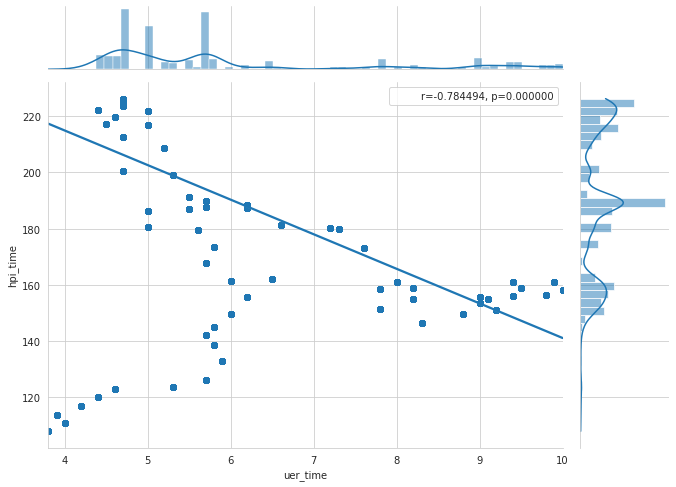

In [216]:


from scipy.stats import pearsonr



j = sns.jointplot(x="uer_time",y="hpi_time",
     data=df,kind='reg')

j.fig.set_figwidth(10)
j.fig.set_figheight(7)
r, p =pearsonr(df.uer_time, df.hpi_time)
phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)

j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])

plt.show()

In [79]:
########  Outstanding balance at observation vs  Outstanding balance at loan origination are positively correlated

In [89]:
print(df.balance_time.min())

print('------------')


print(df.balance_time.max())

0.0
------------
8688100.84


In [90]:
print(df.balance_orig_time.min())

print('------------')


print(df.balance_orig_time.max())

0.0
------------
8000000.0


In [231]:
df.balance_orig_time.quantile([0.00,0.05,0.10,0.20,0.30,0.5,0.75,0.80,0.90,0.95,0.999])

0.000          0.0
0.050      55000.0
0.100      71400.0
0.200     100000.0
0.300     127800.0
0.500     192000.0
0.750     335000.0
0.800     380000.0
0.900     500000.0
0.950     612000.0
0.999    1785015.0
Name: balance_orig_time, dtype: float64

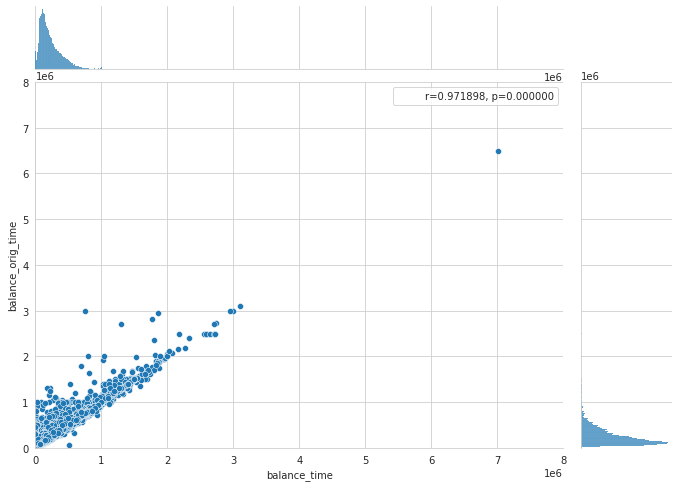

In [236]:
import matplotlib.ticker as ticker

j1 = sns.jointplot(x="balance_time",y="balance_orig_time",
     data=df,dropna=True,
                  xlim=(0,8000000),
                  ylim=(0,8000000))

j1.ax_marg_x.set_xlim(0,8000000)
j1.ax_marg_y.set_ylim(0,8000000)


# j1.ax_joint.set_xticks([0.0, 50000, 100000, 200000, 300000, 500000, 1000000, 1500000,8000000])
# j1.ax_joint.set_yticks([0.0, 50000, 100000, 200000, 300000, 500000, 1000000, 1500000, 8000000])

# j1.ax_joint.xaxis.set_major_locator(ticker.MultipleLocator(100000))
# j1.ax_joint.yaxis.set_major_locator(ticker.MultipleLocator(100000))
# xlabels = ['{:,.2f}'.format(x) + 'K' for x in j1.get_xticks()/10000]
# j1.set_xticklabels(xlabels)

# j1.ax_marg_x.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.2f}'.format(x/100000) + 'K'))

# j1.ax_marg_y.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.2f}'.format(x/100000) + 'K'))

j1.fig.set_figwidth(10)
j1.fig.set_figheight(7)
r, p =pearsonr(df.balance_time, df.balance_orig_time)
phantom, = j1.ax_joint.plot([], [], linestyle="", alpha=0)

j1.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])

plt.show()

In [ ]:
######## Loan-to-value ratio vs House price indexare positively correlated

In [217]:

df['default_time'] = df['default_time'].astype('category')

In [224]:
import plotly.express as px

fig = px.scatter(df,x="balance_time",y="balance_orig_time",
    color="default_time", trendline="ols",template="plotly_white",width=800, height=400)
fig.show()

results = px.get_trendline_results(fig)
# print(results)


# results.query("default_time == '0' and default_time == '1'").px_fit_results.iloc[0].summary()
results.px_fit_results.iloc[0].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                 1.884e+06
Date:                Wed, 22 Sep 2021   Prob (F-statistic):               0.00
Time:                        18:46:55   Log-Likelihood:            -1.6932e+05
No. Observations:               15154   AIC:                         3.386e+05
Df Residuals:                   15152   BIC:                         3.387e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       6449.9491    227.988     28.291      0.000    6003.065    6896.834
x1             0.9783      0.001   1372.698      0.000       0.977       0.980
==============================================================================
Omnibus:                    17848.565   Durbin-Watson:                   1.932
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         19880388.329
Skew:                           5.386   Prob(JB):                         0.00
Kurtosis:                     180.114   Cond. No.                     5.21e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.21e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [154]:
import pandas as pd
from pandas import option_context

with option_context("display.max_rows", None,"display.max_colwidth",60,"display.max_columns",50):
        display(df.head(2))

,id,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,uer_time,retype_co_orig_time,retype_pu_orig_time,retype_sf_orig_time,investor_orig_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time
0,1,48,-7,25,113,29087.21,26.658065,9.20,146.45,2.715903,8.3,0,0,1,0,45000.0,715,69.4,9.20,87.03,1
1,2,26,18,25,138,105654.77,65.469851,7.68,225.10,2.151365,4.7,0,0,1,0,107200.0,558,80.0,7.68,186.91,0


In [97]:
df[df.ltv_time.notnull()].shape

(49982, 21)

In [101]:
df[df.ltv_time.notnull()]['ltv_time'].shape

(49982,)

In [102]:
df[df.ltv_time.notnull()]['hpi_orig_time'].shape

(49982,)

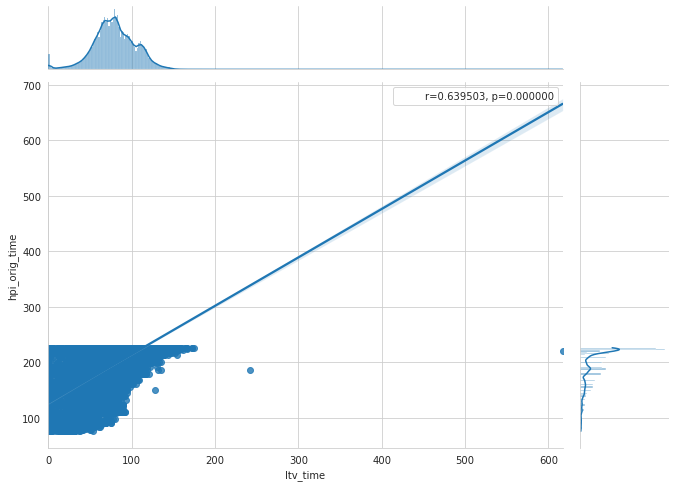

In [103]:


from scipy.stats import pearsonr



j = sns.jointplot(x="ltv_time",y="hpi_orig_time",
     data=df,kind='reg')

j.fig.set_figwidth(10)
j.fig.set_figheight(7)
r, p =pearsonr(df[df.ltv_time.notnull()]['ltv_time'],df[df.ltv_time.notnull()]['hpi_orig_time'])
phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)

j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])

plt.show()

In [75]:
import pandas as pd
from pandas import option_context

with option_context("display.max_rows", None,"display.max_colwidth",60,"display.max_columns",50):
        display(df.head(2))

,id,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,uer_time,retype_co_orig_time,retype_pu_orig_time,retype_sf_orig_time,investor_orig_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time
0,1,48,-7,25,113,29087.21,26.658065,9.20,146.45,2.715903,8.3,0,0,1,0,45000.0,715,69.4,9.20,87.03,1
1,2,26,18,25,138,105654.77,65.469851,7.68,225.10,2.151365,4.7,0,0,1,0,107200.0,558,80.0,7.68,186.91,0


In [98]:
def heatmap_numeric_w_dependent_variable(df, dependent_variable):
    '''
    Takes df, a dependant variable as str
    Returns a heatmap of all independent variables' correlations with dependent variable 
    '''
    import matplotlib.pyplot as plt
    plt.figure(figsize=(8, 10))
    g = sns.heatmap(df.corr()[[dependent_variable]].sort_values(by=dependent_variable), 
                    annot=True, 
                    cmap='RdYlBu', 
                    vmin=-1,
                    vmax=1) 
    return g

In [99]:
# df.drop(['id', 'payoff_time'], axis=1).columns

In [100]:
df.columns

Index(['id', 'time', 'orig_time', 'first_time', 'mat_time', 'balance_time',
       'ltv_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time',
       'retype_co_orig_time', 'retype_pu_orig_time', 'retype_sf_orig_time',
       'investor_orig_time', 'balance_orig_time', 'fico_orig_time',
       'ltv_orig_time', 'interest_rate_orig_time', 'hpi_orig_time',
       'default_time'],
      dtype='object')

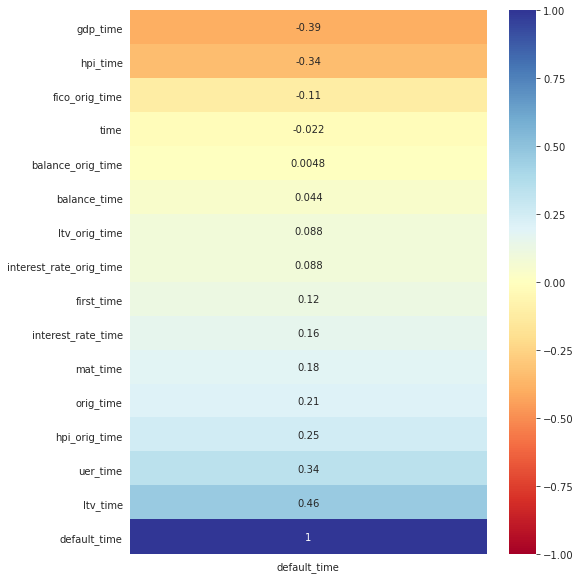

--- 0.4172704219818115 seconds ---


In [101]:
import time
start_time = time.time()

heatmap_numeric_w_dependent_variable(df.drop(['id'], axis=1), 'default_time')

plt.show()
                                     
print("--- %s seconds ---" % (time.time() - start_time))  

In [55]:
######### Numerical correlation ###########

--- 0.3121945858001709 seconds ---


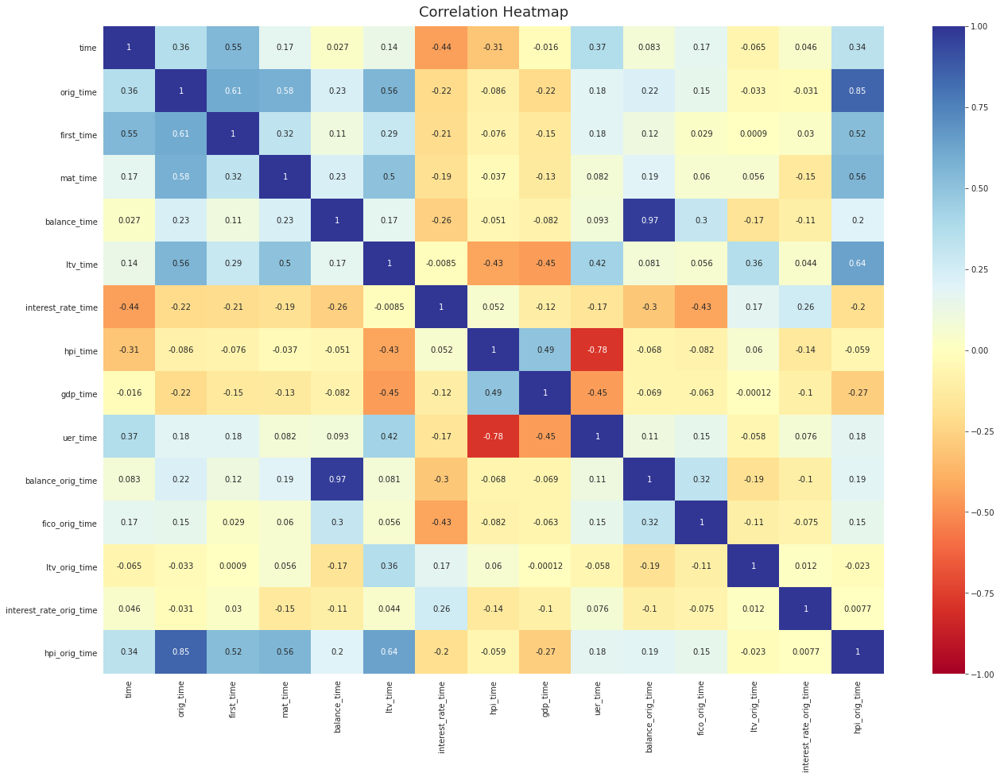

In [102]:
import time
start_time = time.time()

plt.figure(figsize = (22,15))
heatmap = sns.heatmap(df.drop(['id','default_time'], axis=1).corr(), vmin=-1, vmax=1, annot=True,
                      cmap='RdYlBu',xticklabels=True, yticklabels=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

print("--- %s seconds ---" % (time.time() - start_time)) 

In [57]:
# import time
# start_time = time.time()

# plt.figure(figsize = (22,15))

# correlation = df.corr()
# sns.heatmap(correlation, annot = True, vmin=-1, vmax=1, center= 0, cmap= 'coolwarm', linewidths=1, linecolor='black',
#            square=True,xticklabels=True, yticklabels=True)


# print("--- %s seconds ---" % (time.time() - start_time)) 

In [58]:
##########  Multivariate Analysis / Categor ###############

In [92]:
##########  Multivariate Analysis ###############

In [146]:
def plotting_percentages(df, col, target):
    
    color_labels = df['default_time'].unique()

    # List of color palette to use
    rgb_values = sns.color_palette("tab10", 2)

    # Map label to color palette

    color_map = dict(zip(color_labels, rgb_values))


    x, y = col, target
    
    # Temporary dataframe with percentage values
    temp_df = df.groupby(x)[y].value_counts(normalize=True)
    temp_df = temp_df.mul(100).rename('percent').reset_index()

    # Sort the column values for plotting    
    order_list = list(df[col].unique())
    order_list.sort()

    # Plot the figure
    sns.set(font_scale=1.5,style="whitegrid")
    g = sns.catplot(x=x, y='percent', hue=y,kind='bar', data=temp_df, 
#                     height=8, aspect=2, 
                    order=order_list, legend_out=False,palette=df['default_time'].map(color_map))
    g.ax.set_ylim(0,100)
    
    g.fig.set_figwidth(11)
    g.fig.set_figheight(7.5)
    
#     total = len(temp_df)
#     for p in g.ax.patches:
#         percentage = '{:.1f}%'.format(100 * p.get_height()/total)
#         x = p.get_x() + p.get_width() / 2 - 0.05
#         y = p.get_y() + p.get_height()
#         g.annotate(percentage, (x, y), size = 11.5)

    # Loop through each bar in the graph and add the percentage value    
    for p in g.ax.patches:
        txt = str(p.get_height().round(1)) + '%'
        txt_x = p.get_x() + p.get_width() / 2 - 0.05
        txt_y = p.get_y() + p.get_height()
        g.ax.text(txt_x,txt_y,txt, size = 13.5)
        
    # Set labels and title
#     plt.title(f'{col.title()} By Percent {target.title()}', 
#               fontdict={'fontsize': 30})
    plt.xlabel(f'Loan real estate type', fontdict={'fontsize': 14})
    plt.ylabel(f'Default class Percentage by real state type', fontdict={'fontsize': 14})
    plt.xticks(rotation=75)
    return g

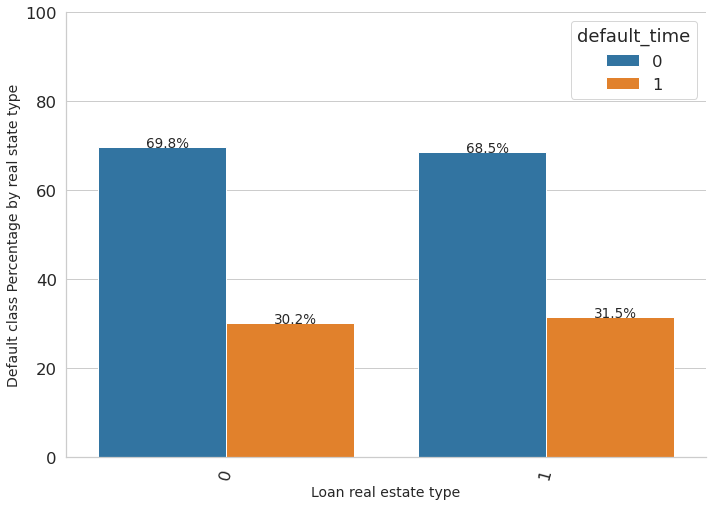

In [147]:
plotting_percentages(df, 'retype_co_orig_time','default_time')
plt.show()

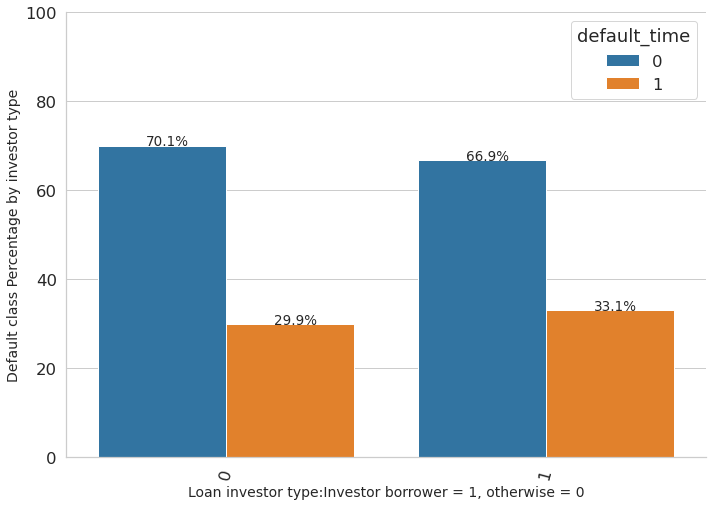

In [148]:
def plotting_percentages(df, col, target):
    
    color_labels = df['default_time'].unique()

    # List of color palette to use
    rgb_values = sns.color_palette("tab10", 2)

    # Map label to color palette

    color_map = dict(zip(color_labels, rgb_values))


    x, y = col, target
    
    # Temporary dataframe with percentage values
    temp_df = df.groupby(x)[y].value_counts(normalize=True)
    temp_df = temp_df.mul(100).rename('percent').reset_index()

    # Sort the column values for plotting    
    order_list = list(df[col].unique())
    order_list.sort()

    # Plot the figure
    sns.set(font_scale=1.5,style="whitegrid")
    g = sns.catplot(x=x, y='percent', hue=y,kind='bar', data=temp_df, 
#                     height=8, aspect=2, 
                    order=order_list, legend_out=False,palette=df['default_time'].map(color_map))
    g.ax.set_ylim(0,100)
    
    g.fig.set_figwidth(11)
    g.fig.set_figheight(7.5)
    
#     total = len(temp_df)
#     for p in g.ax.patches:
#         percentage = '{:.1f}%'.format(100 * p.get_height()/total)
#         x = p.get_x() + p.get_width() / 2 - 0.05
#         y = p.get_y() + p.get_height()
#         g.annotate(percentage, (x, y), size = 11.5)

    # Loop through each bar in the graph and add the percentage value    
    for p in g.ax.patches:
        txt = str(p.get_height().round(1)) + '%'
        txt_x = p.get_x() + p.get_width() / 2 - 0.05
        txt_y = p.get_y() + p.get_height()
        g.ax.text(txt_x,txt_y,txt, size = 13.5)
        
    # Set labels and title
#     plt.title(f'{col.title()} By Percent {target.title()}', 
#               fontdict={'fontsize': 30})
    plt.xlabel(f'Loan investor type:Investor borrower = 1, otherwise = 0', fontdict={'fontsize': 14})
    plt.ylabel(f'Default class Percentage by investor type', fontdict={'fontsize': 14})
    plt.xticks(rotation=75)
    return g

plotting_percentages(df, 'investor_orig_time','default_time')
plt.show()

In [122]:
df.groupby('investor_orig_time')['default_time'].value_counts(normalize=True)

investor_orig_time  default_time
0                   0               0.700681
                    1               0.299319
1                   0               0.668919
                    1               0.331081
Name: default_time, dtype: float64

In [150]:
df.groupby('retype_pu_orig_time')['default_time'].value_counts(normalize=True)

retype_pu_orig_time  default_time
0                    0               0.699113
                     1               0.300887
1                    0               0.680186
                     1               0.319814
Name: default_time, dtype: float64

In [151]:
df.groupby('retype_sf_orig_time')['default_time'].value_counts(normalize=True)

retype_sf_orig_time  default_time
0                    0               0.696380
                     1               0.303620
1                    0               0.697246
                     1               0.302754
Name: default_time, dtype: float64

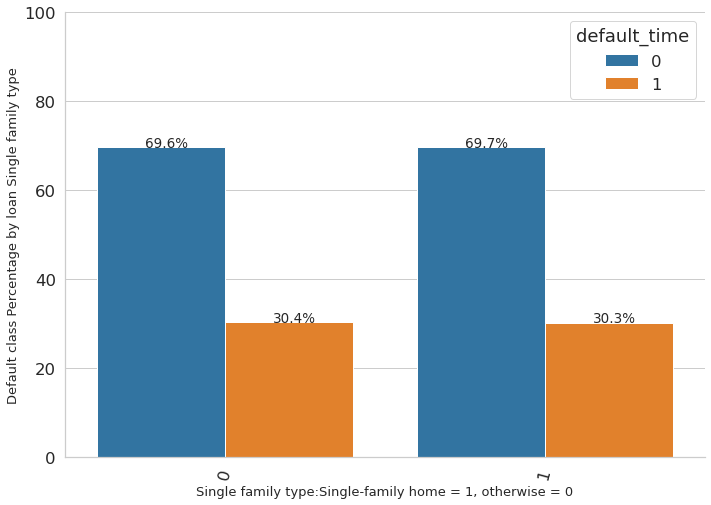

In [153]:
def plotting_percentages(df, col, target):
    
    color_labels = df['default_time'].unique()

    # List of color palette to use
    rgb_values = sns.color_palette("tab10", 2)

    # Map label to color palette

    color_map = dict(zip(color_labels, rgb_values))


    x, y = col, target
    
    # Temporary dataframe with percentage values
    temp_df = df.groupby(x)[y].value_counts(normalize=True)
    temp_df = temp_df.mul(100).rename('percent').reset_index()

    # Sort the column values for plotting    
    order_list = list(df[col].unique())
    order_list.sort()

    # Plot the figure
    sns.set(font_scale=1.5,style="whitegrid")
    g = sns.catplot(x=x, y='percent', hue=y,kind='bar', data=temp_df, 
#                     height=8, aspect=2, 
                    order=order_list, legend_out=False,palette=df['default_time'].map(color_map))
    g.ax.set_ylim(0,100)
    
    g.fig.set_figwidth(11)
    g.fig.set_figheight(7.5)
    
#     total = len(temp_df)
#     for p in g.ax.patches:
#         percentage = '{:.1f}%'.format(100 * p.get_height()/total)
#         x = p.get_x() + p.get_width() / 2 - 0.05
#         y = p.get_y() + p.get_height()
#         g.annotate(percentage, (x, y), size = 11.5)

    # Loop through each bar in the graph and add the percentage value    
    for p in g.ax.patches:
        txt = str(p.get_height().round(1)) + '%'
        txt_x = p.get_x() + p.get_width() / 2 - 0.05
        txt_y = p.get_y() + p.get_height()
        g.ax.text(txt_x,txt_y,txt, size = 13.5)
        
    # Set labels and title
#     plt.title(f'{col.title()} By Percent {target.title()}', 
#               fontdict={'fontsize': 30})
    plt.xlabel(f'Single family type:Single-family home = 1, otherwise = 0', fontdict={'fontsize': 13})
    plt.ylabel(f'Default class Percentage by loan Single family type', fontdict={'fontsize': 13})
    plt.xticks(rotation=75)
    return g

plotting_percentages(df, 'retype_sf_orig_time','default_time')
plt.show()

In [108]:
import pandas as pd
from pandas import option_context

with option_context("display.max_rows", None,"display.max_colwidth",60,"display.max_columns",50):
        display(df.head(1))

,id,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,uer_time,retype_co_orig_time,retype_pu_orig_time,retype_sf_orig_time,investor_orig_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time
0,1,48,-7,25,113,29087.21,26.658065,9.2,146.45,2.715903,8.3,0,0,1,0,45000.0,715,69.4,9.2,87.03,1


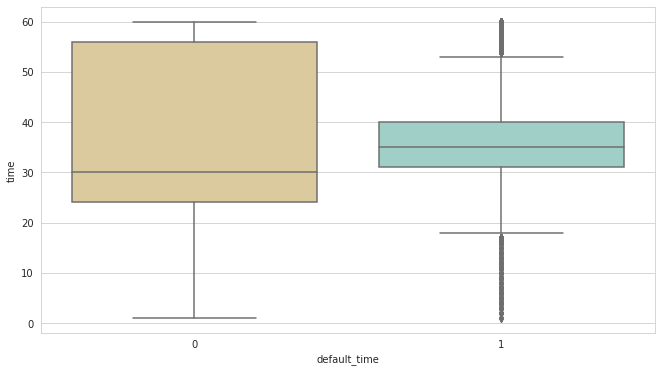

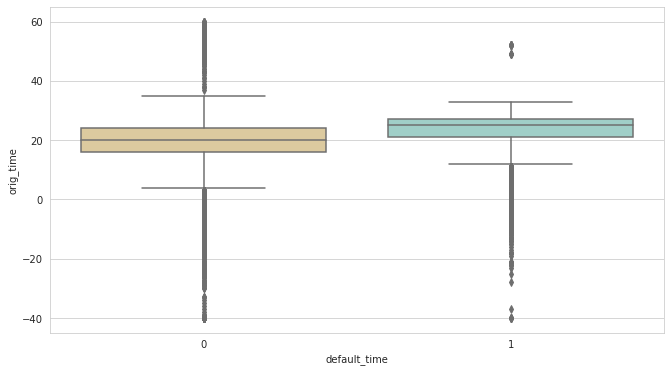

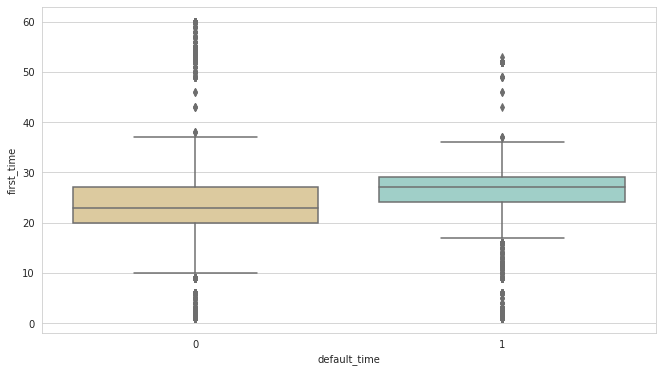

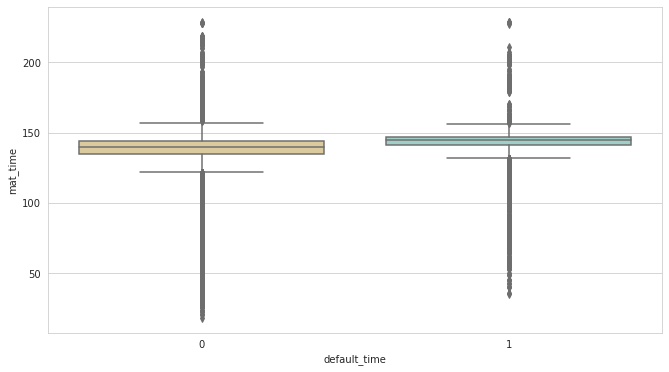

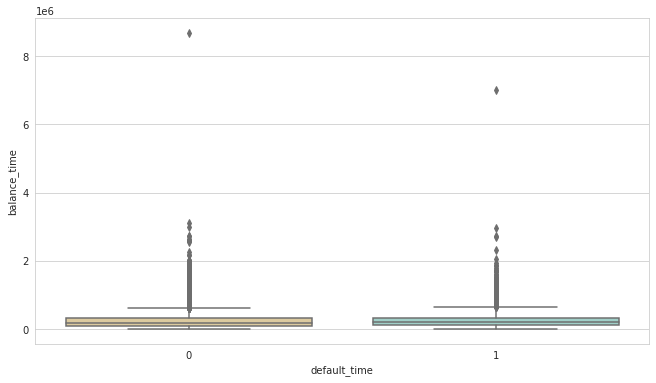

...

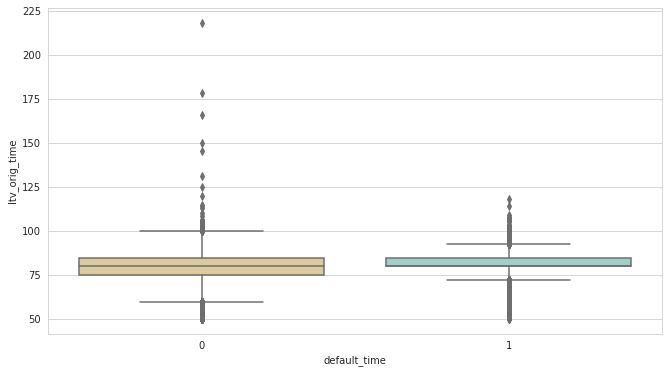

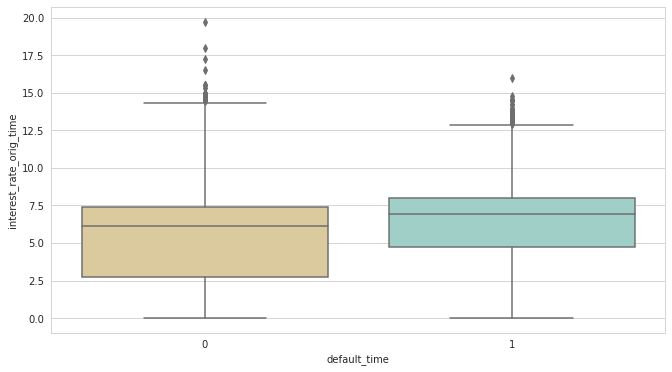

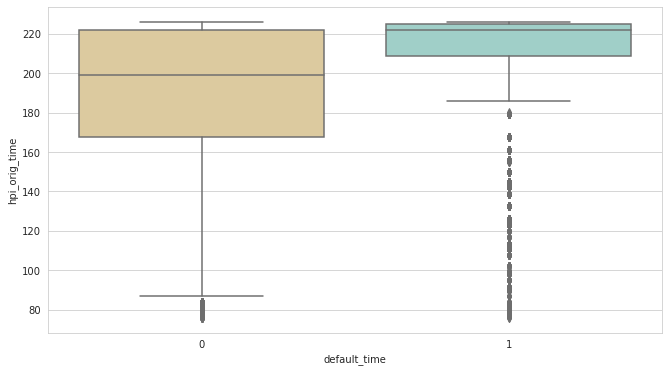

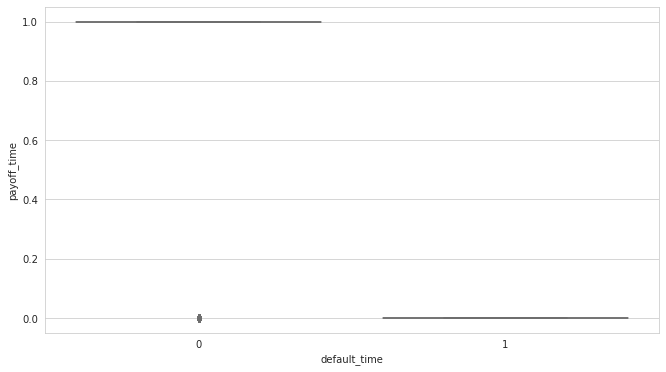

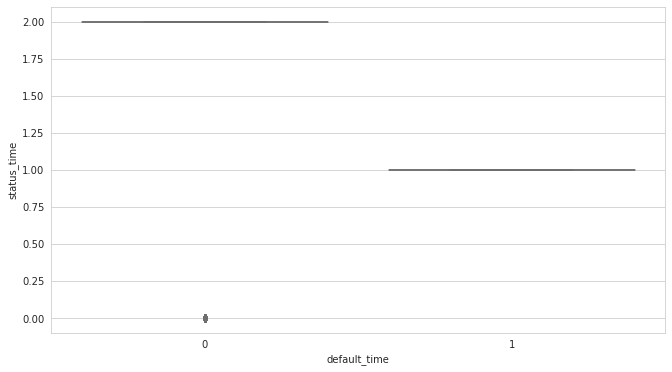

In [60]:
#### box plot
for i in range(0, len(cat_list)):
    cat = cat_list[i]
for j in range(0, len(num_list)):
        num = num_list[j]
        plt.figure (figsize = (11,6))
        sns.boxplot( x = cat, y = num, data = df, palette = 'BrBG')

In [61]:
# for i,col in enumerate(num_list): print(i)

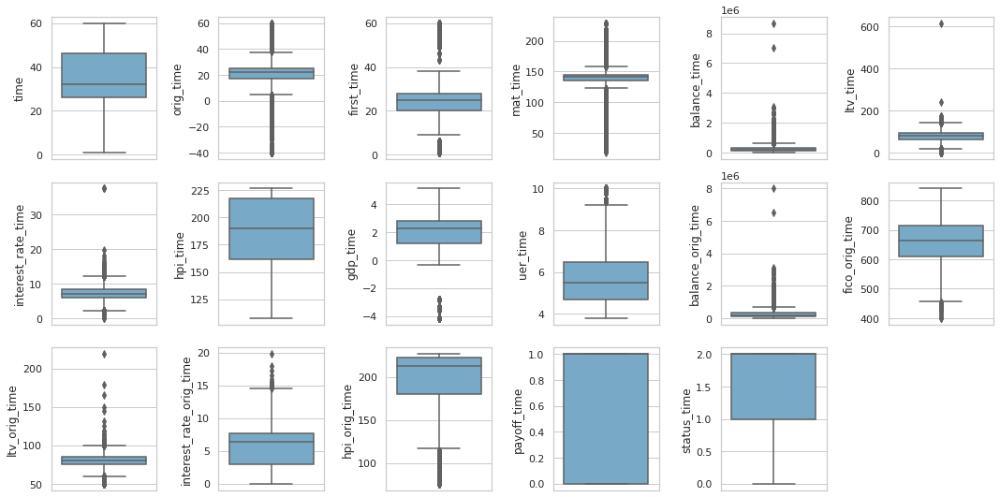

In [62]:
#sns.set_palette('BrBG', 8, .75)
sns.set(style="whitegrid")
plt.figure(figsize=(15,10))

for i,col in enumerate(num_list):    
    plt.subplot(4,6,i + 1)
    sns.boxplot(y=col, data=df,
          palette="Blues")
    #plt.ylabel('')
plt.tight_layout()
plt.show()

In [160]:
df.columns

Index(['id', 'time', 'orig_time', 'first_time', 'mat_time', 'balance_time',
       'ltv_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time',
       'retype_co_orig_time', 'retype_pu_orig_time', 'retype_sf_orig_time',
       'investor_orig_time', 'balance_orig_time', 'fico_orig_time',
       'ltv_orig_time', 'interest_rate_orig_time', 'hpi_orig_time',
       'default_time', 'payoff_time', 'status_time', 'max_periods'],
      dtype='object')

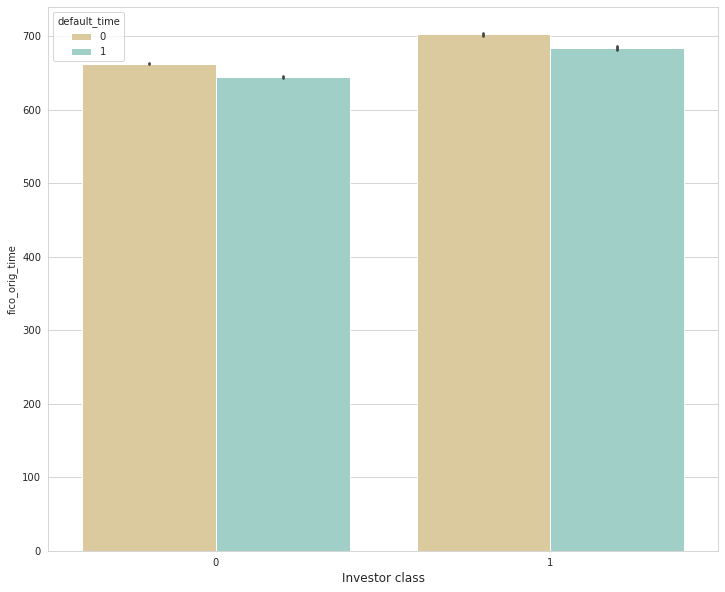

In [161]:
plt.figure(figsize=(12,10))
plt.title('')
sns.barplot(x= 'investor_orig_time',y='fico_orig_time',data=df,hue='default_time',
            order=df[ 'investor_orig_time'].value_counts().index,palette = 'BrBG')
plt.xlabel('Investor class',fontsize=12)
plt.show()

In [77]:
from pandas import option_context

with option_context('display.max_rows', None,'display.max_colwidth', 40,'display.max_columns', None):
           display(df.head(2))

,id,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,uer_time,retype_co_orig_time,retype_pu_orig_time,retype_sf_orig_time,investor_orig_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time,payoff_time,status_time,max_periods
0,1,48,-7,25,113,29087.21,26.658065,9.20,146.45,2.715903,8.3,0,0,1,0,45000.0,715,69.4,9.20,87.03,1,0,1,24
1,2,26,18,25,138,105654.77,65.469851,7.68,225.10,2.151365,4.7,0,0,1,0,107200.0,558,80.0,7.68,186.91,0,1,2,2


In [72]:
######### Group stats function #########

In [78]:
df.groupby(df.default_time)['ltv_time'].describe().reset_index()

,default_time,count,mean,std,min,25%,50%,75%,max
0,0,34833.0,71.643049,22.468797,0.000000,59.645982,71.924705,84.243441,616.985143
1,1,15149.0,96.945979,21.841958,3.600425,82.865224,98.818582,112.622405,175.071039


In [82]:
def get_group_statistics(categorical, numerical):
    group_df = df[[categorical, numerical]].groupby(categorical).describe().reset_index().dropna()
    print(group_df.head())

In [83]:
get_group_statistics('default_time', 'balance_time')

  default_time balance_time                                         \
                      count           mean            std      min   
0            0      34846.0  233085.460963  205658.087888     0.00   
1            1      15154.0  252508.819453  196398.929358  2883.06   

                                                   
           25%         50%        75%         max  
0  100536.2925  174611.595  312000.00  8688100.84  
1  119243.2600  203084.765  335244.04  7019196.39  


In [84]:
get_group_statistics('default_time', 'uer_time')

  default_time uer_time                                              
                  count      mean       std  min  25%  50%  75%   max
0            0  34846.0  5.629831  1.343605  3.8  4.7  5.3  5.7  10.0
1            1  15154.0  6.854078  2.014235  3.8  5.0  6.5  9.0  10.0


In [85]:
get_group_statistics('default_time', 'fico_orig_time')

  default_time fico_orig_time                                              \
                        count        mean        std    min    25%    50%   
0            0        34846.0  666.654595  74.411247  400.0  615.0  669.0   
1            1        15154.0  648.978092  67.340957  413.0  604.0  651.0   

                 
     75%    max  
0  724.0  840.0  
1  696.0  818.0  


In [66]:
df['hpi_time'].groupby(df['default_time']).mean()

default_time
0    196.213840
1    176.674574
Name: hpi_time, dtype: float64

In [79]:
df['ltv_orig_time'].groupby(df['default_time']).mean()

default_time
0    79.134030
1    81.025716
Name: ltv_orig_time, dtype: float64

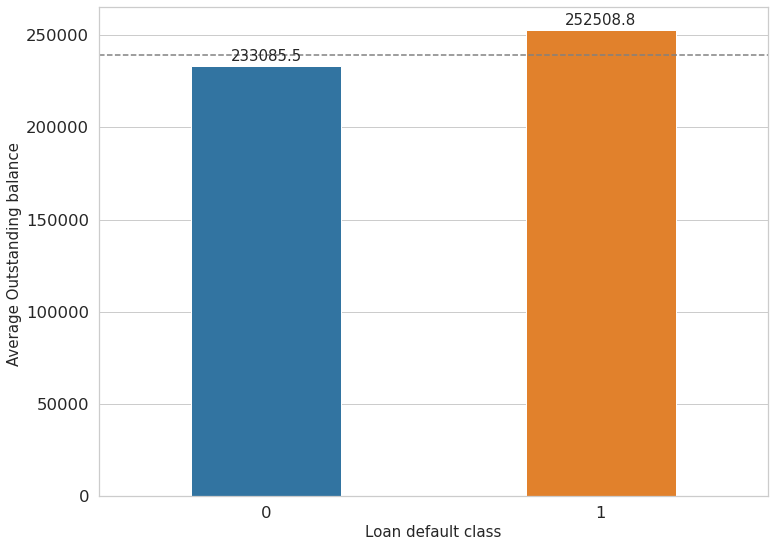

In [179]:
color_labels = df['default_time'].unique()

# List of color palette to use
rgb_values = sns.color_palette("tab10", 2)

# Map label to color palette

color_map = dict(zip(color_labels, rgb_values))

col_series = df['balance_time'].groupby(df['default_time']).mean()

plt.figure(figsize=(12,9))

splot = sns.barplot(x=[index for index,value in col_series.items()],
            y=[value for index,value in col_series.items()],
            data=df, 
            palette=df['default_time'].map(color_map))
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 10), 
                   textcoords = 'offset points',
                   fontsize = 15)
    
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(splot, .45)

#plt.title('Average Outstanding balance (by default class)', fontsize = 18, pad = 12)
plt.xlabel("Loan default class", fontsize = 15)
plt.axhline(y=df['balance_time'].mean(), color='gray', linestyle='dashed', 
            label="Average loan outstanding balance ")
plt.ylabel("Average Outstanding balance ",fontsize = 15);

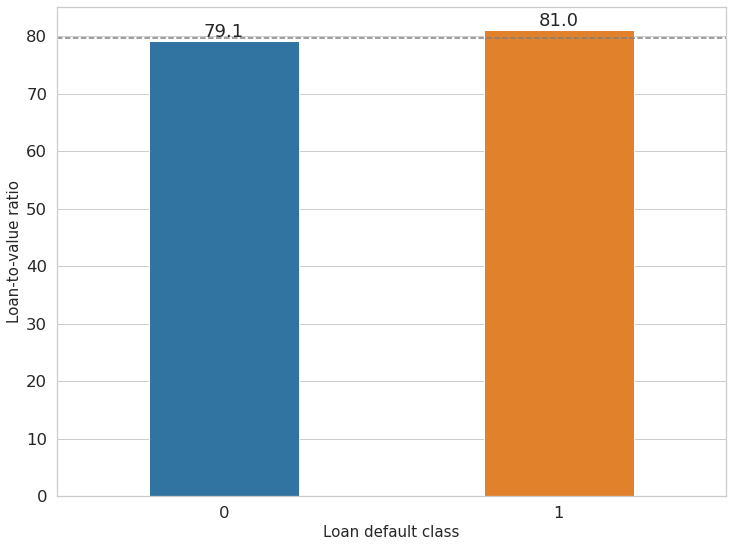

In [261]:
color_labels = df['default_time'].unique()

# List of color palette to use
rgb_values = sns.color_palette("tab10", 2)

# Map label to color palette

color_map = dict(zip(color_labels, rgb_values))

# plt.figure(figsize=(12,9))


col_series = df['ltv_orig_time'].groupby(df['default_time']).mean()

plt.figure(figsize=(12,9))

splot = sns.barplot(x=[index for index,value in col_series.items()],
            y=[value for index,value in col_series.items()],
            data=df, 
            palette=df['default_time'].map(color_map))
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
    
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(splot, .45)

#plt.title('Average ltv (by default class)', fontsize = 18, pad = 12)
plt.xlabel("Loan default class", fontsize = 15)
plt.axhline(y=df['ltv_orig_time'].mean(), color='gray', 
            linestyle='dashed', label="ltv Average")
plt.ylabel("Loan-to-value ratio",fontsize = 15);

In [69]:
df['gdp_time'].groupby(df['default_time']).mean()

default_time
0    2.184817
1    0.553259
Name: gdp_time, dtype: float64

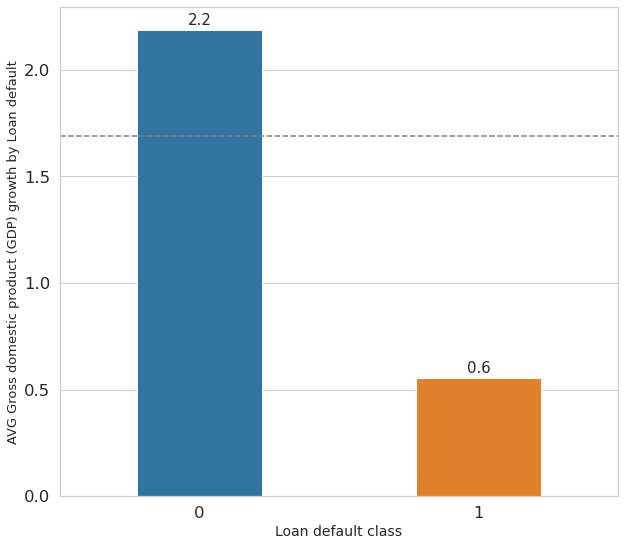

In [253]:
color_labels = df['default_time'].unique()

# List of color palette to use
rgb_values = sns.color_palette("tab10", 2)

# Map label to color palette

color_map = dict(zip(color_labels, rgb_values))

col_series = df['gdp_time'].groupby(df['default_time']).mean()

plt.figure(figsize=(10,9))

splot = sns.barplot(x=[index for index,value in col_series.items()],
            y=[value for index,value in col_series.items()],
            data=df, 
             palette=df['default_time'].map(color_map))

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 10), 
                   textcoords = 'offset points',fontsize = 15)
#plt.title('Average Gross domestic product (GDP) growth  (by default class)', fontsize = 18, pad = 12)

def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(splot, .45)

plt.xlabel("Loan default class", fontsize = 14)
plt.axhline(y=df['gdp_time'].mean(), color='gray', linestyle='dashed', label="Gross domestic product (GDP) growth Average")
plt.ylabel("AVG Gross domestic product (GDP) growth by Loan default",fontsize = 13);

In [198]:
df['hpi_time'].groupby(df['default_time']).mean()

default_time
0    196.213840
1    176.674574
Name: hpi_time, dtype: float64

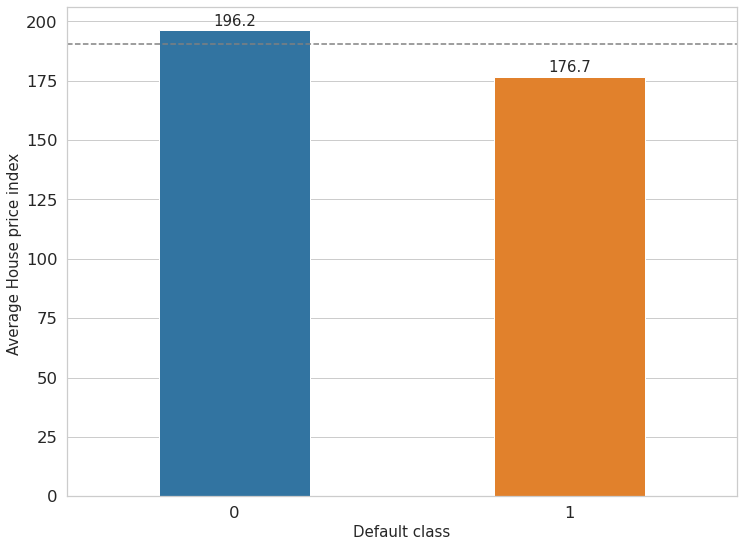

In [200]:

color_labels = df['default_time'].unique()

# List of color palette to use
rgb_values = sns.color_palette("tab10", 2)

# Map label to color palette

color_map = dict(zip(color_labels, rgb_values))

col_series = df['hpi_time'].groupby(df['default_time']).mean()



col_series = df['hpi_time'].groupby(df['default_time']).mean()

plt.figure(figsize=(12,9))

splot = sns.barplot(x=[index for index,value in col_series.items()],
            y=[value for index,value in col_series.items()],
            data=df, 
           palette=df['default_time'].map(color_map))

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points',
                  fontsize = 15)
    

def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(splot, .45)

#plt.title('Average House price index (by default class)', fontsize = 18, pad = 12)
plt.xlabel("Default class", fontsize = 15)
plt.axhline(y=df['hpi_time'].mean(), color='gray', linestyle='dashed', label="House price index Average")
plt.ylabel("Average House price index ",fontsize = 15);
plt.show()

In [257]:
df['balance_orig_time'].groupby(df['default_time']).mean()

default_time
0    251320.438778
1    253486.329573
Name: balance_orig_time, dtype: float64

In [258]:
df['balance_time'].groupby(df['default_time']).mean()

default_time
0    233085.460963
1    252508.819453
Name: balance_time, dtype: float64

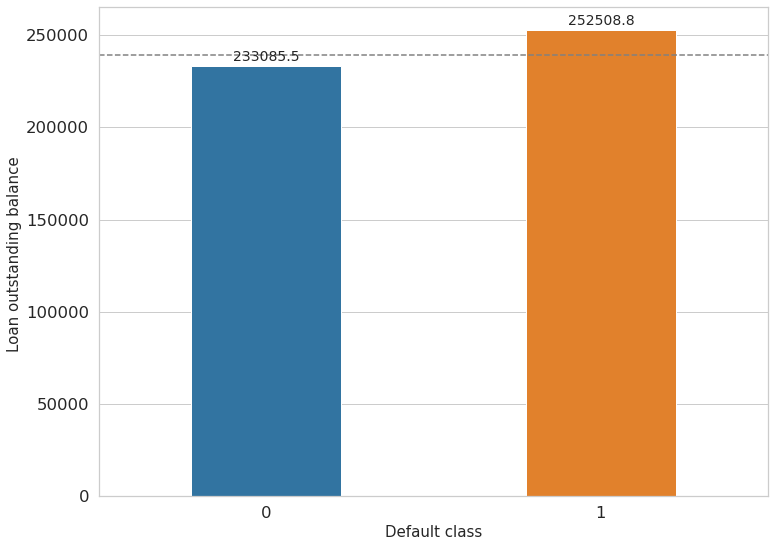

In [260]:

color_labels = df['default_time'].unique()

# List of color palette to use
rgb_values = sns.color_palette("tab10", 2)

# Map label to color palette

color_map = dict(zip(color_labels, rgb_values))

col_series =df['balance_time'].groupby(df['default_time']).mean()



plt.figure(figsize=(12,9))

splot = sns.barplot(x=[index for index,value in col_series.items()],
            y=[value for index,value in col_series.items()],
            data=df, 
           palette=df['default_time'].map(color_map))

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points',
                  fontsize = 14)
    

def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(splot, .45)

#plt.title('Average House price index (by default class)', fontsize = 18, pad = 12)
plt.xlabel("Default class", fontsize = 15)
plt.axhline(y=df['balance_time'].mean(), color='gray', linestyle='dashed', label="House price index Average")
plt.ylabel("Loan outstanding balance ",fontsize = 15);
plt.show()

In [271]:
########### Box plots ###############

In [ ]:
######## Run stats test ########

In [239]:
from pandas import option_context

with option_context('display.max_rows', None,'display.max_colwidth', 40,'display.max_columns', None):
           display(df.head(6))

,id,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,uer_time,retype_co_orig_time,retype_pu_orig_time,retype_sf_orig_time,investor_orig_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time
0,1,48,-7,25,113,29087.21,26.658065,9.200,146.45,2.715903,8.3,0,0,1,0,45000.0,715,69.4,9.200,87.03,1
1,2,26,18,25,138,105654.77,65.469851,7.680,225.10,2.151365,4.7,0,0,1,0,107200.0,558,80.0,7.680,186.91,0
2,3,29,-6,25,114,44378.60,31.459735,11.375,217.37,1.692969,4.5,0,0,1,0,48600.0,680,83.6,8.750,89.58,0
3,4,60,-2,25,119,52686.35,34.898842,10.500,189.82,2.836358,5.7,0,0,1,0,63750.0,587,81.8,10.500,97.99,0
4,5,27,18,25,138,52100.71,66.346343,9.155,222.39,2.361722,4.4,0,0,1,0,52800.0,527,80.0,9.155,186.91,0
5,6,56,19,25,139,190474.11,75.834755,6.580,181.43,1.717053,6.6,0,0,1,0,212000.0,670,80.0,6.580,191.42,1


In [234]:
df.loc[df['default_time']==1, 'gdp_time']

0        2.715903
5        1.717053
8       -4.146711
9        1.692969
15      -0.314448
           ...   
49939    0.892996
49943    1.081049
49947    0.892996
49965    2.422275
49971    1.717053
Name: gdp_time, Length: 15154, dtype: float64

In [230]:
default 

Series([], Name: default_time, dtype: int64)

In [201]:
from statsmodels.stats.weightstats import CompareMeans

In [242]:
def z_test(df, col, target='default_time'):
    from statsmodels.stats.weightstats import CompareMeans
    default = df.loc[df[target]==1, col,]
    non_default = df.loc[df[target]==0, col,]
    
    print("number of default loan :", len(default ))
    print("number of non default loan:", len(non_default))

    z_data = CompareMeans.from_data(default, non_default)
    z, p = CompareMeans.ztest_ind(z_data)
    print('For {}, z = {}, p = {}'.format(col, z, p))

In [243]:
z_test(df, 'gdp_time')

number of default loan : 15154
number of non default loan: 34846
For gdp_time, z = -94.99359969913891, p = 0.0


In [ ]:
df['hpi_time'].groupby(df['default_time']).mean()

In [244]:
z_test(df, 'interest_rate_orig_time')

number of default loan : 15154
number of non default loan: 34846
For interest_rate_orig_time, z = 19.729707141015485, p = 1.1986267885003293e-86


In [245]:
z_test(df, 'fico_orig_time')

number of default loan : 15154
number of non default loan: 34846
For fico_orig_time, z = -25.11101233060273, p = 3.770397018705559e-139


In [246]:
z_test(df, 'hpi_orig_time')

number of default loan : 15154
number of non default loan: 34846
For hpi_orig_time, z = 57.92075429816264, p = 0.0


In [247]:
z_test(df, 'ltv_orig_time')

number of default loan : 15154
number of non default loan: 34846
For ltv_orig_time, z = 19.671859412594245, p = 3.7574611297203826e-86


In [262]:
z_test(df, 'balance_time')

number of default loan : 15154
number of non default loan: 34846
For balance_time, z = 9.837954818963754, p = 7.726550290683865e-23


In [189]:
df['gdp_time'].groupby(df['default_time']).mean()

default_time
0    2.184817
1    0.553259
Name: gdp_time, dtype: float64

In [263]:
df['balance_time'].groupby(df['default_time']).mean()

default_time
0    233085.460963
1    252508.819453
Name: balance_time, dtype: float64

In [264]:
#create two new dataframes based on whether or not their is a profile pic
default = df[df["default_time"] == 1]
non_default= df[df["default_time"] == 0]

#get the mean total sales of each dataframe
default_loan_balance_mean = default["balance_time"].mean()
no_default_loan_balance_mean = non_default["balance_time"].mean()

# get the row count of each new dataframe
print("items with profile pic:", len(default))
print("items without profile pic:", len(non_default))


print('-----------------------')

print("loan default customer balance mean:", default_loan_balance_mean)
print("non default loan customer balance mean:", no_default_loan_balance_mean)


items with profile pic: 15154
items without profile pic: 34846
-----------------------
loan default customer balance mean: 252508.81945295038
non default loan customer balance mean: 233085.4609630938


In [298]:
default["balance_time"].var()

38572539453.11788

In [299]:
non_default["balance_time"].var()

42295249113.86374

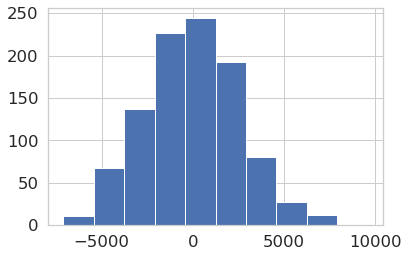

In [266]:
import numpy as np

mean_difference = default_loan_balance_mean  - no_default_loan_balance_mean
# a series of all values from the total_sales column
all_loan_balances = df["balance_time"]

mean_differences = []
# for loop to create our 1000 permutations
for i in range(1000):
    # empty array to represent a random total sales w/ profile pic
    group_a = []
    # empty array to represent a random total sales w/o profile pic
    group_b = []
    
    # use a for loop to randomonly place the total sales in one of the two lists
    for all_loan_balance in all_loan_balances:
        random_value = np.random.random()
        # randomally assinging each value to a new list
        if random_value > 0.85:
            group_a.append(all_loan_balance)
        elif random_value <= 0.85:
             group_b.append(all_loan_balance)
    mean_group_a = np.mean(group_a)
    mean_group_b = np.mean(group_b)
    # find the itteration mean and append to our mean difference list
    iteration_mean_difference =  mean_group_a - mean_group_b
    mean_differences.append(iteration_mean_difference)

# use matplotlib to visulize the mean_differences list as a histogram
plt.hist(mean_differences)
plt.show()   

In [ ]:
###### From the histogram, we can see the most frequent difference in means is around 0. 
###### This is very different than our test statistic. In fact, doesn’t even show the
##### test statistic value. The p-value will give us a way to quantify how many times 
#### the test statistic value is in the random sample distribution of mean differences.

In [269]:
## Let’s create a for loop that will check tally how many times our test statistic shows 
##up in our group of the randomly generated mean differences. We will then take that tally
### and divide it by our total iterations(1000). Our output will be the p-value.

total = 0

#for loop to check if random mean diff is greater than our mean difference
for mean_diff in mean_differences:
    if mean_diff >= mean_difference:
        total += 1

#p value calculated by calulating percentage of values greater then the mean difference
p_value = total / 1000


print("our p-value is:", p_value)

our p-value is: 0.0


In [270]:
# The Outcome
# Earlier we decided out p-value threshold would be .05. 0 is less than .05
# which means we can rule out our test statistic was a result of random chance. 
# We can now reject our null hypothesis and confirm our alternative hypothesis.

In [71]:
import scipy.stats as ss

In [300]:
####This is a two-sided test for the null hypothesis that 2 independent samples have identical average (expected) values.
##### means of two independent groups

In [72]:
def run_ttest(df):
    bal_in_default = df.loc[df.default_time == 1, 'balance_time']
    default_mean = bal_in_default.mean()
    
    bal_in_non_default = df.loc[df.default_time == 0, 'balance_time']
    non_default_mean = bal_in_non_default.mean()
    
    result = ss.ttest_ind(bal_in_default, bal_in_non_default, equal_var=False)
    conclusion = 'Significant' if result.pvalue < 0.05 else 'Not Significant'
    
    return pd.Series({'n_default':bal_in_default.shape[0],
                      'n_non_default': bal_in_non_default.shape[0],
                      'mean_default': default_mean,
                      'mean_ctrl': non_default_mean,
                      'default-non_default': default_mean - non_default_mean,
                      'pvalue':result.pvalue,
                      'conclusion':conclusion})

In [73]:
run_ttest(df)

n_default                    15154
n_non_default                34846
mean_default                252509
mean_ctrl                   233085
default-non_default        19423.4
pvalue                 1.38389e-23
conclusion             Significant
dtype: object


##### according to above Hypothesis Test result, there is significant difference in the default customer loan balances vs non default.

In [103]:
####### run test overall ########

In [104]:
df.loc[df.default_time == 1].head(1)

,id,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,...,retype_co_orig_time,retype_pu_orig_time,retype_sf_orig_time,investor_orig_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time
0,1,48,-7,25,113,29087.21,26.658065,9.2,146.45,2.715903,...,0,0,1,0,45000.0,715,69.4,9.2,87.03,1


In [105]:
df.loc[df.default_time == 0].head(1)

,id,time,orig_time,first_time,mat_time,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,...,retype_co_orig_time,retype_pu_orig_time,retype_sf_orig_time,investor_orig_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time
1,2,26,18,25,138,105654.77,65.469851,7.68,225.1,2.151365,...,0,0,1,0,107200.0,558,80.0,7.68,186.91,0


In [102]:
print(num_list)

print('------------')

print(cat_list)

['time', 'orig_time', 'first_time', 'mat_time', 'balance_time', 'ltv_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time', 'balance_orig_time', 'fico_orig_time', 'ltv_orig_time', 'interest_rate_orig_time', 'hpi_orig_time']
------------
['retype_co_orig_time', 'retype_pu_orig_time', 'retype_sf_orig_time', 'investor_orig_time', 'default_time']


In [110]:
# df.loc[df.default_time == 0][num_list].head(1)

In [121]:
#### Apply chi-squared tests to the categorical columns

for col in cat_list[0:4]:
    cont_table = pd.crosstab(df['default_time'], df[col])
    score, p_value, dof, array = ss.chi2_contingency(cont_table)
    print ('X-squared for {}: X-Score:{}    p-value:{}'.format(col, score, p_value))

X-squared for retype_co_orig_time: X-Score:2.14521830984228    p-value:0.1430146915880258
X-squared for retype_pu_orig_time: X-Score:8.598345571866467    p-value:0.003364685255051021
X-squared for retype_sf_orig_time: X-Score:0.03761742450719753    p-value:0.8462133733102897
X-squared for investor_orig_time: X-Score:24.7762536861468    p-value:6.438580988079101e-07


In [122]:
#### It appears that there is significant differences in  default and non default borrowers 
#### based on the Real estate type planned urban development for the property 

In [ ]:

# Apply chi-squared tests to the categorical columns
for col in CATEGORICAL:
    cont_table = pd.crosstab(int_df['churn'], int_df[col])
    score, p_value, dof, array = stats.chi2_contingency(cont_table)
    print ('X-squared for {}: X-Score:{}    p-value:{}'.format(col, score, p_value))

In [ ]:
df['interest_rate_time'].groupby(df['default_time']).mean()

In [249]:
def bargrid(df, nb_unique_limit):
    """
    Create a bar chart for each categorical/numerical discrete
    variable in the dataset containing a number of unique values 
    less or equal to the selected limit.
    
    Parameters
    ----------
    df: pandas DataFrame
        DataFrame containing categorical and/or numerical discrete
        variables.
    nb_unique_limit: integer
        Number of unique values used as a cut-off to ensure chart
        readability.
    """
    
    ## Create list of names variables to plot
    var_cat = np.array([var for var in df if df[var].nunique() <= nb_unique_limit])
    
    ## Print statement for cases where this figure is not relevant
    if var_cat.size == 0:
        print(
'''There are no categorical and/or numerical discrete
variables in this dataset containing the cut-off number of
unique values or less, so bar charts are not relevant.
        ''')
    
    ## Create grid of bar charts
    else:
        # Set parameters for figure dimensions
        ncols_max = 5
        ncols = var_cat.size if var_cat.size < ncols_max else ncols_max
        nrows = int(np.ceil(var_cat.size/ncols))
        subp_w = 3 if ncols <= 3 else 15/ncols
        subp_h = 1.25*subp_w

        # Generate figure with appropriate dimensions and spacing between subplots
        fig = plt.figure(figsize=(ncols*subp_w, nrows*subp_h))
        fig.subplots_adjust(hspace=0.3, wspace=0.4)

        # Draw pandas bar charts side-by-side
        cmap = plt.cm.tab10.colors
        for idx, var in enumerate(var_cat):
            ax = fig.add_subplot(nrows, ncols, idx+1)
            counts = df[var].value_counts().sort_index()
            counts.plot.bar(width=0.5, color=cmap[idx%len(cmap)], title=var, ax=ax)
            ax.set_ylabel('count', labelpad=10) if (idx/ncols)%1 == 0 else None
            ax.locator_params(axis='y', integer=True)
            ax.tick_params(axis='x', rotation=0, length=0, pad=5)
        sns.despine()

--- 0.22315502166748047 seconds ---


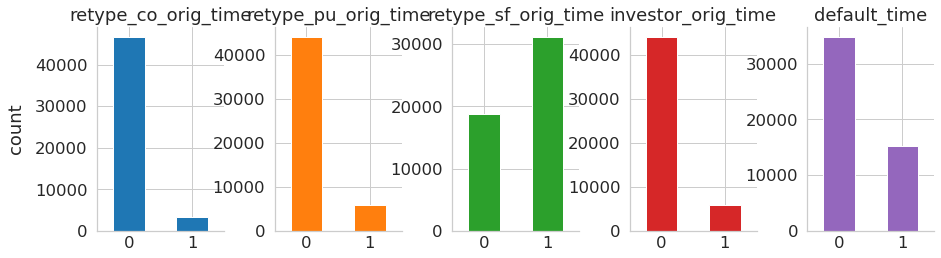

In [250]:
import time
start_time = time.time()

bargrid(df, 10)

print("--- %s seconds ---" % (time.time() - start_time)) 

In [164]:
######### Categorical eda function ########

In [281]:
def initial_eda(df):
    # List of categorical columns
    cat_cols = df.select_dtypes(['object','category']).columns
    
    for col in cat_cols:
        # Formatting
        column_name = col.title().replace('_', ' ')
        title = 'Distribution of ' + column_name
        unique_values = len(df[col].value_counts())
        
        # If statements for formatting 
        if 2<=unique_values<3: 
            plt.figure(figsize = (4, 6))
            sns.countplot(x=df[col], 
                          data=df, 
                          palette="Paired",
                          order = df[col].value_counts().index)
            plt.title(title, fontsize = 18, pad = 12)
            plt.xlabel(column_name, fontsize = 15)
            plt.xticks(rotation=20)
            plt.ylabel("Frequency",fontsize = 15)
            plt.show();
        elif 3<=unique_values<8:
            plt.figure(figsize = (8, 6))
            sns.countplot(x=df[col], 
                          data=df, 
                          palette="Paired",
                          order = df[col].value_counts().index)
            plt.title(title, fontsize = 18, pad = 12)
            plt.xlabel(column_name, fontsize = 15)
            plt.xticks(rotation=20)
            plt.ylabel("Frequency",fontsize = 15)
            plt.show();
        elif 8<=unique_values<=12:
            plt.figure(figsize = (10, 6))
            sns.countplot(x=df[col], 
                          data=df, 
                          palette="Paired",
                          order = df[col].value_counts().index)
            plt.title(title, fontsize = 18, pad = 12)
            plt.xlabel(column_name, fontsize = 15)
            plt.xticks(rotation=20)
            plt.ylabel("Frequency",fontsize = 15)
            plt.show();
        else:
            print(f'{column_name} has {len(df[col].value_counts())} unique values. Here are the top 10:')
            print()
            col_count  = df[col].value_counts()
            col_count = col_count[:10,]
            plt.figure(figsize = (12, 6))
            sns.barplot(x = col_count.index, 
                        y = col_count.values, 
                        palette="Paired")
            plt.title(f'Top 10 {column_name}s', fontsize = 18, pad = 12)
            plt.ylabel('Frequency', fontsize=15)
            plt.xticks(rotation=20)
            plt.xlabel(column_name, fontsize=15)
            plt.show()
            
    return

Id has 50000 unique values. Here are the top 10:



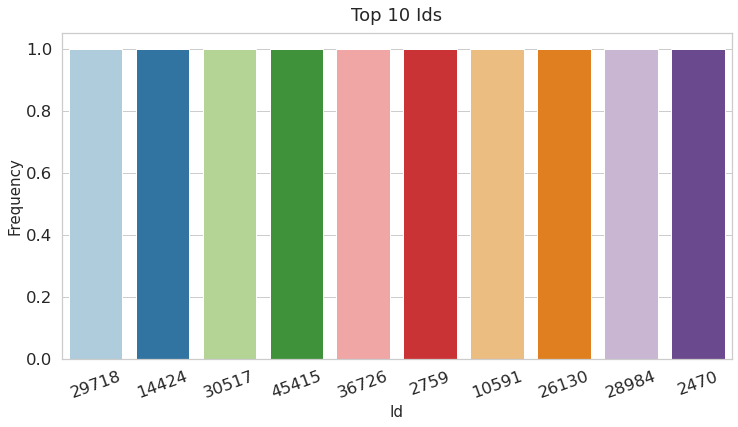

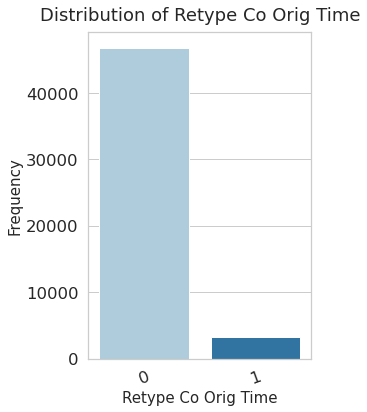

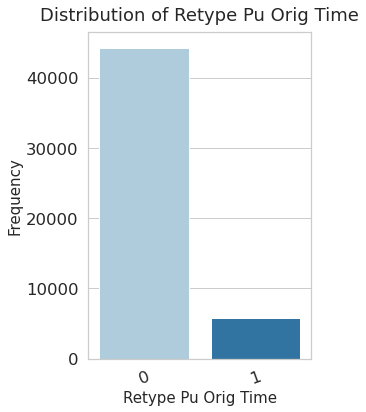

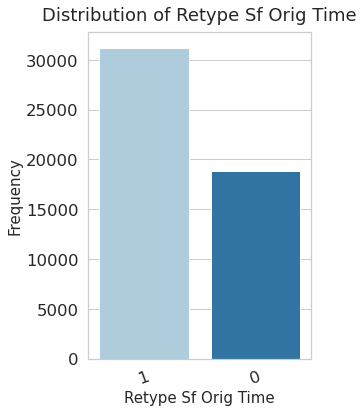

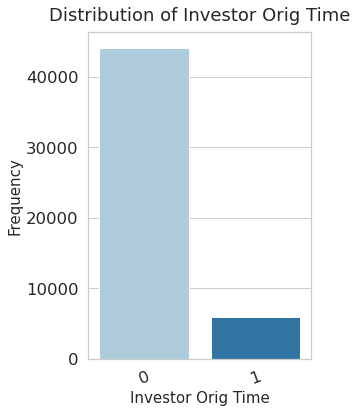

In [282]:
initial_eda(df)

In [167]:
######### Time series plot #########

In [168]:
def timegrid(df):
    """
    Create a time series plot of each numerical variables in the dataset.
    
    Parameters
    ----------
    df: pandas DataFrame
        DataFrame containing a time series.
    """
    
    ## Select variables to plot
    var_num = df.select_dtypes('number').columns
    if 'datetime' in str(type(df.index)):
        var_date = None
    else:
        var_date = df.select_dtypes('datetime').columns[0]
    
    ncharts = var_num.size
    
    ## Print statement for cases where this figure is not relevant
    if ncharts == 0:
        print(
'''There are no numerical variables in this dataset, so time series
plots for numerical variables are not relevant.
        ''')
    
    ## Create timegrid
    else:
        # Define figure dimensions parameters
        ncols_max = 3
        ncols = ncharts if ncharts < ncols_max else ncols_max
        nrows = int(np.ceil(ncharts/ncols))
        width = 7 if ncols <= 2 else 5 if ncols <= 3 else 15/ncols
        height = 0.75*width
        
        fig = plt.figure(figsize=(ncols*width, nrows*height))
        colormap = plt.cm.tab10.colors
        # Draw pandas scatterplots side-by-side
        for idx, var in enumerate(var_num):
            ax = fig.add_subplot(nrows, ncols, idx+1)
            df.plot(x=var_date, y=var, marker='.', ms=5, linestyle='', linewidth=1,
                    color=colormap[idx%len(colormap)], ax=ax)
            ax.set_xlabel(xlabel=var_date, labelpad=10)
            ax.set_ylabel(var)
            ax.legend().remove()
            if idx < ncols*nrows-ncols:
                ax.set_xlabel('')
                ax.set_xticklabels([])
        sns.despine()
        fig.subplots_adjust(hspace=0.1, wspace=0.3)

In [169]:
import time
start_time = time.time()

if df.select_dtypes('datetime').size == 0 and 'datetime' not in str(type(df.index)):
    print('There is no time series in this dataset')
else:
    timegrid(df)
    
print("--- %s seconds ---" % (time.time() - start_time)) 

There is no time series in this dataset
--- 0.0018382072448730469 seconds ---


In [170]:
######### Outliers detection dataset ########

In [ ]:
#### I would analyze our outlier is through IQR.

In [294]:

##### Analyze outliers with H- spread

def outliers(df):

    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    print(IQR)
    
    df_clear = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]
    df_clear.reset_index(drop=True, inplace=True)
    
    return df_clear

In [295]:
data_tukey = outliers(df)


print(data_tukey.shape)

time                           20.000000
orig_time                       8.000000
first_time                      8.000000
mat_time                        9.000000
balance_time               213725.817500
ltv_time                       31.628905
interest_rate_time              2.475000
hpi_time                       55.280000
gdp_time                        1.607186
uer_time                        1.800000
balance_orig_time          221000.000000
fico_orig_time                104.000000
ltv_orig_time                  10.000000
interest_rate_orig_time         4.625000
hpi_orig_time                  42.940000
default_time                    1.000000
dtype: float64
(31254, 21)


In [ ]:
##### our data is being dramatically reduced by applying the Tukey method. 
#### I would consider losing almost  60 % our of the data as a huge loss, therefore 
#### we will proceed with more specific outliers removal.

In [291]:
((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).sum()

balance_orig_time          1728
balance_time               1847
default_time                  0
fico_orig_time               37
first_time                 3108
gdp_time                   4812
hpi_orig_time              1980
hpi_time                      0
id                            0
interest_rate_orig_time      23
interest_rate_time         1843
investor_orig_time            0
ltv_orig_time              2287
ltv_time                   1035
mat_time                   6034
orig_time                  2395
retype_co_orig_time           0
retype_pu_orig_time           0
retype_sf_orig_time           0
time                          0
uer_time                   4291
dtype: int64

In [292]:
def IQR_Outliers (X, features):

    print('# of features: ', len(features))
    print('Features: ', features)

    indices = [x for x in X.index]
    #print(indices)
    print('Number of samples: ', len(indices))
    
    out_indexlist = []
        
    for col in features:
       
        #Using nanpercentile instead of percentile because of nan values
        Q1 = np.nanpercentile(X[col], 25.)
        Q3 = np.nanpercentile(X[col], 75.)
        
        cut_off = (Q3 - Q1) * 1.5
        upper, lower = Q3 + cut_off, Q1 - cut_off
        print ('\nFeature: ', col)
        print ('Upper and Lower limits: ', upper, lower)
                
        outliers_index = X[col][(X[col] < lower) | (X[col] > upper)].index.tolist()
        outliers = X[col][(X[col] < lower) | (X[col] > upper)].values
        print('Number of outliers: ', len(outliers))
        print('Outliers Index: ', outliers_index)
        print('Outliers: ', outliers)
        
        out_indexlist.extend(outliers_index)
        
    #using set to remove duplicates
    out_indexlist = list(set(out_indexlist))
    out_indexlist.sort()
    print('\nNumber of rows with outliers: ', len(out_indexlist))
    #print('List of rows with outliers: ', out_indexlist)

IQR_Outliers(df, num_list)

# of features:  16
Features:  ['time', 'orig_time', 'first_time', 'mat_time', 'balance_time', 'ltv_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time', 'balance_orig_time', 'fico_orig_time', 'ltv_orig_time', 'interest_rate_orig_time', 'hpi_orig_time', 'default_time']
Number of samples:  50000

Feature:  time
Upper and Lower limits:  76.0 -4.0
Number of outliers:  0
Outliers Index:  []
Outliers:  []

Feature:  orig_time
Upper and Lower limits:  37.0 5.0
Number of outliers:  2395
Outliers Index:  [0, 2, 3, 55, 56, 57, 58, 59, 60, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 401, 2034, 2035, 2038, 2048, 2049, 2050, 2051, 2052, 2053, 2054, 2055, 2056, 2057, 2058, 2059, 2216, 2290, 2291, 2292, 2325, 2344, 2345, 2346, 2347, 2348, 2349, 2350, 2351, 2352, 2353, 2354, 2355, 2357, 2358, 2359, 2370, 2449, 2499, 2500, 2501, 2517, 2586, 2587, 2648, 2649, 2652, 2653, 2654, 2655, 2656, 2657, 2660, 2662, 2663, 2664, 2665, 2666, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332

In [120]:
##### Outliers #####

In [121]:
# Data Set Mortgage
# The data set mortgage is in panel form and reports origination and performance observations for 50,000 residential U.S. mortgage borrowers over 60 periods. The periods have been deidentified. As in the real world, loans may originate before the start of the observation period (this is an issue where loans are transferred between banks and investors as in securitization). The loan observations may thus be censored as the loans mature or borrowers refinance. The data set is a randomized selection of mortgage-loan-level data collected from the portfolios underlying U.S. residential mortgage-backed securities (RMBS) securitization portfolios and provided by International Financial Research (www.internationalfinancialresearch.org). Go to www.win-rar.com if ﻿you require a program to decompress. Key variables include:
# ◾ id: Borrower ID
# ◾ time: Time stamp of observation
# ◾ orig_time: Time stamp for origination
# ◾ first_time: Time stamp for first observation
# ◾ mat_time: Time stamp for maturity
# ◾ balance_time: Outstanding balance at observation time
# ◾ LTV_time: Loan-to-value ratio at observation time, in %
# ◾ interest_rate_time: Interest rate at observation time, in %
# ◾ hpi_time: House price index at observation time, base year = 100
# ◾ gdp_time: Gross domestic product (GDP) growth at observation time, in %
# ◾ uer_time: Unemployment rate at observation time, in %
# ◾ REtype_CO_orig_time: Real estate type condominium = 1, otherwise = 0
# ◾ REtype_PU_orig_time: Real estate type planned urban development = 1, otherwise = 0
# ◾ REtype_SF_orig_time: Single-family home = 1, otherwise = 0
# ◾ investor_orig_time: Investor borrower = 1, otherwise = 0
# ◾ balance_orig_time: Outstanding balance at origination time
# ◾ FICO_orig_time: FICO score at origination time, in %
# ◾ LTV_orig_time: Loan-to-value ratio at origination time, in %
# ◾ Interest_Rate_orig_time: Interest rate at origination time, in %
# ◾ hpi_orig_time: House price index at origination time, base year = 100
# ◾ default_time: Default observation at observation time
# ◾ payoff_time: Payoff observation at observation time
# ◾ status_time: Default (1), payoff (2), and nondefault/nonpayoff (0) observation at observation time

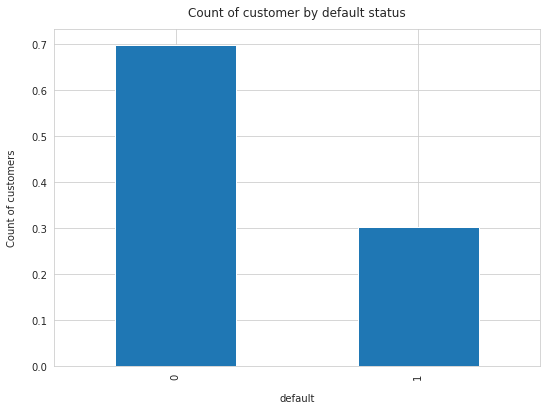

In [34]:
plt.figure(figsize = (8.7,6.2))
sns.set_style("whitegrid")

df['default_time'].value_counts(normalize=True).plot(kind = "bar")
plt.xlabel("default", labelpad=14)
plt.ylabel("Count of customers", labelpad=14)
plt.title("Count of customer by default status", y=1.02);
plt.show()

In [35]:
# new_df.groupby(['default_time']).size().plot(kind = "bar")
# plt.show()

In [36]:
df.groupby(['default_time', 'status_time'])['id'].count().reset_index(name="count")

,default_time,status_time,count
0,0,0,8257
1,0,2,26589
2,1,1,15154


In [37]:
df.groupby('status_time').size().reset_index(name='counts')

,status_time,counts
0,0,8257
1,1,15154
2,2,26589


In [38]:
############### subset and save for initial modeling ###########

In [39]:
df.columns

Index(['id', 'time', 'orig_time', 'first_time', 'mat_time', 'balance_time',
       'ltv_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time',
       'retype_co_orig_time', 'retype_pu_orig_time', 'retype_sf_orig_time',
       'investor_orig_time', 'balance_orig_time', 'fico_orig_time',
       'ltv_orig_time', 'interest_rate_orig_time', 'hpi_orig_time',
       'default_time', 'payoff_time', 'status_time', 'max_periods'],
      dtype='object')

In [40]:
df.drop(['id', 'time', 'orig_time',  'mat_time','first_time','payoff_time', 'status_time'], axis=1, inplace=True)

In [41]:
len(df.columns)

17

In [42]:
from pandas import option_context

with option_context('display.max_rows', None,'display.max_colwidth', 100,'display.max_columns',50):
              display(df.head(2))

,balance_time,ltv_time,interest_rate_time,hpi_time,gdp_time,uer_time,retype_co_orig_time,retype_pu_orig_time,retype_sf_orig_time,investor_orig_time,balance_orig_time,fico_orig_time,ltv_orig_time,interest_rate_orig_time,hpi_orig_time,default_time,max_periods
0,29087.21,26.658065,9.20,146.45,2.715903,8.3,0,0,1,0,45000.0,715,69.4,9.20,87.03,1,24
1,105654.77,65.469851,7.68,225.10,2.151365,4.7,0,0,1,0,107200.0,558,80.0,7.68,186.91,0,2


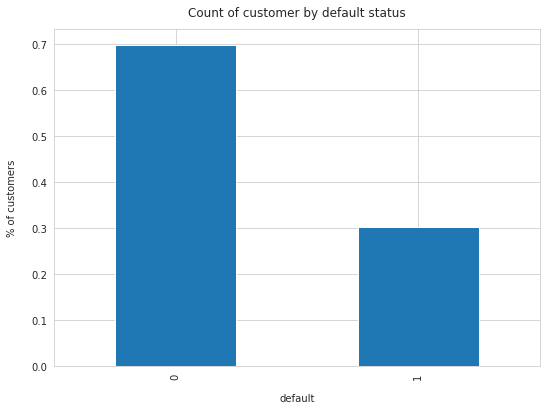

In [43]:
plt.figure(figsize = (8.7,6.2))
sns.set_style("whitegrid")

df['default_time'].value_counts(normalize=True).plot(kind = "bar")
plt.xlabel("default", labelpad=14)
plt.ylabel("% of customers", labelpad=14)
plt.title("Count of customer by default status", y=1.02);
plt.show()

In [189]:
############## save intermediate bucked for modeling ############

In [190]:
df.columns

Index(['balance_time', 'ltv_time', 'interest_rate_time', 'hpi_time',
       'gdp_time', 'uer_time', 'retype_co_orig_time', 'retype_pu_orig_time',
       'retype_sf_orig_time', 'investor_orig_time', 'balance_orig_time',
       'fico_orig_time', 'ltv_orig_time', 'interest_rate_orig_time',
       'hpi_orig_time', 'default_time', 'max_periods'],
      dtype='object')

In [44]:
import time
start_time = time.time()

wr.s3.to_csv(
    df=df,
    index=False,
    path="s3://daan888/projectcr/data/semiprocessed/mortgage_risk_unique_semi_processed.csv")

print("--- %s seconds ---" % (time.time() - start_time))

--- 0.789741039276123 seconds ---


In [4]:

import numpy as np
import pandas as pd
np.arange(0.05, 2, 0.05)

array([0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55,
       0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  , 1.05, 1.1 ,
       1.15, 1.2 , 1.25, 1.3 , 1.35, 1.4 , 1.45, 1.5 , 1.55, 1.6 , 1.65,
       1.7 , 1.75, 1.8 , 1.85, 1.9 , 1.95])

In [7]:
np.arange(50, 500, 25)

array([ 50,  75, 100, 125, 150, 175, 200, 225, 250, 275, 300, 325, 350,
       375, 400, 425, 450, 475])

In [12]:
np.arange(1, 50, 2),

(array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
        35, 37, 39, 41, 43, 45, 47, 49]),)